# DBTL Microalgae Annotation Pipeline
## Comparative Metabolic Pathway Annotation — *Dunaliella salina* & *Nannochloropsis gaditana*

**Autor:** José Campos · Universidade do Minho | **Orientador:** Óscar Dias

---

### Ferramentas
| Papel | Ferramenta |
|---|---|
| Anotação KO | **KofamScan** (local, via Snakemake) |
| Anotação COG | **reCOGnyzer** |
| Mapas KEGG | **KEGGCharter** |
| Comparação de vias | **KEGG REST API + matplotlib** |

### Ordem do pipeline
1. Setup do ambiente (`prjenv`)
2. Imports e estrutura de pastas
3. Configuração das espécies e verificação dos FASTAs
4. QC das proteínas
5. KofamScan via Snakemake
6. Carregar e inspecionar resultados KofamScan
7. Análise KEGG — completude das vias
8. reCOGnyzer — anotação COG
9. DIAMOND blastp vs Swiss-Prot
10. Validação cruzada (Venn KofamScan vs DIAMOND)
11. Comparação inter-espécies de KOs
12. Vias-alvo — carotenoides & omega-3 PUFA
13. KEGGCharter — mapas de vias

> **Working directory:** `~/aulas/projeto/dbtl_workspace`  
> FASTAs em: `data/proteins/D_salina_protein.fa` e `data/proteins/N_gaditana_protein.faa`


## 1 · Setup do ambiente

Instala todas as ferramentas no ambiente conda `prjenv`.
**Corre esta célula uma vez e reinicia o kernel.**


In [2]:
import subprocess, sys

pkgs = 'kofamscan diamond recognizer keggcharter hmmer'
print(f'[conda] A instalar: {pkgs}')
r = subprocess.run(
    f'conda install -y -c conda-forge -c bioconda {pkgs}',
    shell=True, capture_output=True, text=True
)
if r.returncode != 0:
    print('[ERRO]', r.stderr[-600:])
else:
    print('[OK] ferramentas instaladas')

subprocess.run([sys.executable, '-m', 'pip', 'install', '-q',
    'pandas', 'matplotlib', 'seaborn', 'biopython', 'matplotlib-venn', 'requests'],
    check=True)
print('\nSetup completo — reinicia o kernel.')


[conda] A instalar: kofamscan diamond recognizer keggcharter hmmer
[OK] ferramentas instaladas

Setup completo — reinicia o kernel.


## 2 · Imports e estrutura de pastas


In [3]:
import subprocess, time, shutil, json, sys
from pathlib import Path
import requests
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from Bio import SeqIO
import numpy as np
import random
random.seed(42); np.random.seed(42)

WORKDIR = Path.cwd()
print(f'Working directory: {WORKDIR}')

DIRS = {
    'proteins':    Path('data/proteins'),
    'swissprot':   Path('resources/swissprot'),
    'kofamscan':   Path('results/kofamscan'),
    'recogNyzer':  Path('results/recogNyzer'),
    'diamond':     Path('results/diamond'),
    'comparison':  Path('results/comparison'),
    'keggcharter': Path('results/keggcharter'),
    'benchmark':   Path('results/benchmark'),
    'kegg_cache':  Path('resources/kegg_cache'),
    'snakemake':   Path('workflow'),
}
for d in DIRS.values():
    d.mkdir(parents=True, exist_ok=True)
print('Pastas criadas/verificadas.')


Working directory: /home/jose-campos/aulas/projeto/project_workspace
Pastas criadas/verificadas.


## 3 · Configuração das espécies e verificação dos FASTAs

Os ficheiros devem estar em `data/proteins/` com os nomes exactos abaixo.
A célula verifica que existem e mostra o nº de proteínas.


In [4]:
SPECIES = {
    'D_salina': {
        'label':   'Dunaliella salina',
        'faa':     Path('data/proteins/D_salina_protein.fa'),
    },
    'N_gaditana': {
        'label':   'Nannochloropsis gaditana B-31',
        'faa':     Path('data/proteins/N_gaditana_protein.faa'),
    },
}

faa_paths = {}
all_ok = True
for key, meta in SPECIES.items():
    faa = meta['faa']
    if faa.exists() and faa.stat().st_size > 0:
        n = sum(1 for l in open(faa) if l.startswith('>'))
        print(f"{meta['label']}: {n:,} proteínas — {faa}")
        faa_paths[key] = faa
    else:
        print(f"{meta['label']}: {faa} não encontrado")
        all_ok = False

if not all_ok:
    print('\nColoca os FASTAs em data/proteins/ e volta a correr.')
else:
    print('\nAmbos os FASTAs prontos.')


Dunaliella salina: 16,697 proteínas — data/proteins/D_salina_protein.fa
Nannochloropsis gaditana B-31: 10,929 proteínas — data/proteins/N_gaditana_protein.faa

Ambos os FASTAs prontos.


## 4 · QC das proteínas


Dunaliella salina: 16,697 proteínas, mediana 275 aa
Nannochloropsis gaditana B-31: 10,929 proteínas, mediana 321 aa


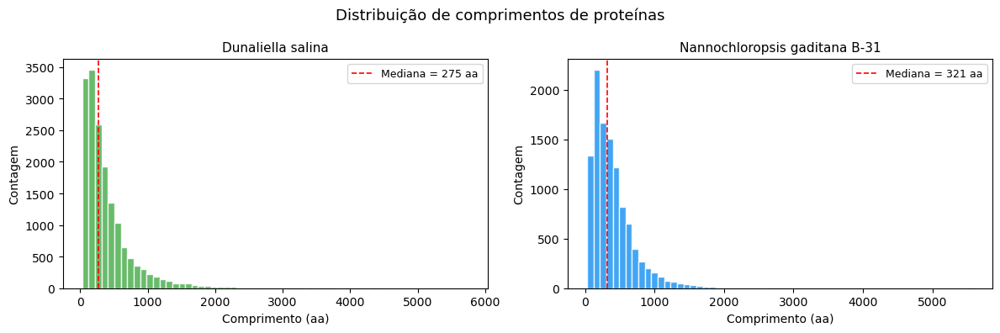

In [5]:
available = {k: v for k, v in faa_paths.items() if v.exists()}
if not available:
    print('Nenhum FASTA disponível.')
else:
    n_sp = len(available)
    fig, axes = plt.subplots(1, n_sp, figsize=(6 * n_sp, 4))
    if n_sp == 1: axes = [axes]
    colors = ['#4CAF50', '#2196F3']
    for ax, (key, faa), col in zip(axes, available.items(), colors):
        lengths = [len(r.seq) for r in SeqIO.parse(faa, 'fasta')]
        ax.hist(lengths, bins=60, color=col, edgecolor='white', alpha=0.85)
        med = int(np.median(lengths))
        ax.axvline(med, color='red', ls='--', lw=1.2, label=f'Mediana = {med} aa')
        ax.set_title(SPECIES[key]['label'], fontsize=11)
        ax.set_xlabel('Comprimento (aa)'); ax.set_ylabel('Contagem')
        ax.legend(fontsize=9)
        print(f"{SPECIES[key]['label']}: {len(lengths):,} proteínas, mediana {med} aa")
    fig.suptitle('Distribuição de comprimentos de proteínas', fontsize=13)
    plt.tight_layout()
    plt.savefig('results/qc_protein_lengths.png', dpi=150, bbox_inches='tight')
    plt.show()


## 5 · KofamScan via Snakemake

O KofamScan atribui números KO (KEGG Orthology) a proteínas usando perfis HMM.

**Fluxo:**
1. Esta célula gera `workflow/Snakefile` automaticamente
2. As bases de dados (~24 GB) são descarregadas na 1ª execução
3. Corre primeiro *D. salina*, depois *N. gaditana* (uma espécie de cada vez)

**Input:** FASTA de proteínas  
**Output:** `results/kofamscan/<espécie>_kofam.tsv`  
> ⏱ Tempo estimado: 30–90 min por espécie (8 cores)


In [6]:
SNAKEFILE = DIRS['snakemake'] / 'Snakefile'

sf_lines = [
    '# Snakefile — gerado automaticamente pelo notebook',
    '# Uso no terminal: cd workflow && snakemake --cores 8',
    '',
    'SPECIES = {',
    '    "D_salina":   "data/proteins/D_salina_protein.fa",',
    '    "N_gaditana": "data/proteins/N_gaditana_protein.faa",',
    '}',
    '',
    'rule all:',
    '    input:',
    '        expand("results/kofamscan/{sp}_kofam.tsv",    sp=SPECIES),',
    '        expand("results/diamond/{sp}_diamond_hits.tsv", sp=SPECIES),',
    '',
    '# ── Rule 1: Download KOfam database ─────────────────────────────────',
    'rule download_kofam_db:',
    '    output:',
    '        profiles = directory("resources/kofam/profiles"),',
    '        ko_list  = "resources/kofam/ko_list"',
    '    shell:',
    '        """',
    '        mkdir -p resources/kofam && cd resources/kofam',
    '        if [ ! -f ko_list ]; then',
    '            wget -q ftp://ftp.genome.jp/pub/db/kofam/ko_list.gz && gunzip ko_list.gz',
    '        fi',
    '        if [ ! -d profiles ]; then',
    '            wget -q ftp://ftp.genome.jp/pub/db/kofam/profiles.tar.gz',
    '            tar -xzf profiles.tar.gz && rm profiles.tar.gz',
    '        fi',
    '        """',
    '',
    '# ── Rule 2: KofamScan — KO assignment ───────────────────────────────',
    'rule kofamscan:',
    '    input:',
    '        faa      = lambda wc: SPECIES[wc.sp],',
    '        profiles = "resources/kofam/profiles",',
    '        ko_list  = "resources/kofam/ko_list"',
    '    output:',
    '        tsv = "results/kofamscan/{sp}_kofam.tsv"',
    '    threads: 8',
    '    shell:',
    '        """',
    '        exec_annotation \\',
    '            --profile {input.profiles} \\',
    '            --ko-list  {input.ko_list} \\',
    '            --cpu      {threads} \\',
    '            --format   detail-tsv \\',
    '            -o         {output.tsv} \\',
    '            {input.faa}',
    '        """',
    '',
    '# ── Rule 3: Download Swiss-Prot + build DIAMOND database ────────────',
    'rule download_swissprot:',
    '    output:',
    '        faa = "resources/swissprot/uniprot_sprot.fasta",',
    '        db  = "resources/swissprot/swissprot.dmnd"',
    '    threads: 8',
    '    shell:',
    '        """',
    '        mkdir -p resources/swissprot',
    '        if [ ! -f resources/swissprot/uniprot_sprot.fasta ]; then',
    '            wget -q -O resources/swissprot/uniprot_sprot.fasta.gz \\',
    '                https://ftp.uniprot.org/pub/databases/uniprot/current_release/knowledgebase/complete/uniprot_sprot.fasta.gz',
    '            gunzip -f resources/swissprot/uniprot_sprot.fasta.gz',
    '        fi',
    '        diamond makedb \\',
    '            --in      resources/swissprot/uniprot_sprot.fasta \\',
    '            --db      resources/swissprot/swissprot.dmnd \\',
    '            --threads {threads}',
    '        """',
    '',
    '# ── Rule 4: DIAMOND blastp vs Swiss-Prot ────────────────────────────',
    'rule diamond_blastp:',
    '    input:',
    '        faa = lambda wc: SPECIES[wc.sp],',
    '        db  = "resources/swissprot/swissprot.dmnd"',
    '    output:',
    '        tsv = "results/diamond/{sp}_diamond_hits.tsv"',
    '    threads: 8',
    '    shell:',
    '        """',
    '        mkdir -p results/diamond',
    '        diamond blastp \\',
    '            --db             {input.db} \\',
    '            --query          {input.faa} \\',
    '            --out            {output.tsv} \\',
    '            --outfmt 6 qseqid sseqid pident length evalue bitscore stitle qcovhsp \\',
    '            --sensitive \\',
    '            --evalue         1e-5 \\',
    '            --max-target-seqs 5 \\',
    '            --threads        {threads}',
    '        """',
]

SNAKEFILE.write_text('\n'.join(sf_lines) + '\n')
print(f'Snakefile escrito em {SNAKEFILE}')

Snakefile escrito em workflow/Snakefile


In [7]:
def run_kofamscan(species_key, cores=8):
    # Aceita ficheiros de KofamKOALA (_significant.tsv) ou Snakemake (_kofam.tsv)
    out_tsv = None
    for name in [f'{species_key}_kofam.tsv', f'{species_key}_kofam_significant.tsv']:
        candidate = DIRS['kofamscan'] / name
        if candidate.exists() and candidate.stat().st_size > 1000:
            out_tsv = candidate
            break
    if out_tsv is None:
        out_tsv = DIRS['kofamscan'] / f'{species_key}_kofam.tsv'

    faa = faa_paths.get(species_key)

    if out_tsv.exists() and out_tsv.stat().st_size > 1000:
        n = sum(1 for l in open(out_tsv) if l.strip().startswith('*'))
        print(f'[SKIP] {species_key}: {n:,} atribuições KO já existem → {out_tsv.name}')
        return out_tsv
    
    if not faa or not faa.exists():
        print(f'[ERRO] FASTA de {species_key} não encontrado — resolve a célula 3.')
        return out_tsv

    if subprocess.run(['which', 'exec_annotation'], capture_output=True).returncode != 0:
        print('[ERRO] exec_annotation não encontrado.')
        print('       Corre a célula 1 (setup) e reinicia o kernel.')
        return out_tsv

    print(f"[KofamScan] {SPECIES[species_key]['label']} — {cores} cores")
    print('  A correr... (30–90 min por espécie)')
    target = f'results/kofamscan/{species_key}_kofam.tsv'
    result = subprocess.run(
        ['snakemake',
         '--snakefile', str(SNAKEFILE),
         '--cores', str(cores),
         '--nolock', '--rerun-incomplete',
         target],
        cwd=str(WORKDIR),
        capture_output=True, text=True
    )
    if result.returncode != 0:
        print(f'[ERRO] Snakemake:\n{result.stderr[-1500:]}')
    else:
        n = sum(1 for l in open(out_tsv) if l.strip().startswith('*')) if out_tsv.exists() else 0
        print(f'{n:,} atribuições KO → {out_tsv}')
    return out_tsv

kofam_results = {}

print('D. salina')
kofam_results['D_salina'] = run_kofamscan('D_salina', cores=8)

print('\nN. gaditana')
kofam_results['N_gaditana'] = run_kofamscan('N_gaditana', cores=8)


D. salina
[SKIP] D_salina: 3,366 atribuições KO já existem → D_salina_kofam.tsv

N. gaditana
[SKIP] N_gaditana: 3,199 atribuições KO já existem → N_gaditana_kofam.tsv


## 6 · Carregar e inspecionar resultados KofamScan

Formato `detail-tsv`: linhas com `*` são significativas (acima do threshold HMM).  
Colunas: flag · gene · KO · threshold · score · E-value · definição KO


In [8]:
def load_kofamscan(tsv):
    rows = []
    with open(tsv) as fh:
        for line in fh:
            if line.startswith('#') or not line.strip(): continue
            p = line.split('\t') if '\t' in line else line.split()
            if p[0].strip() == '*' and len(p) >= 6:
                try:
                    rows.append({
                        'gene':   p[1].strip(),
                        'ko':     p[2].strip(),
                        'score':  float(p[4].strip()),
                        'evalue': float(p[5].strip()),
                        'ko_def': ' '.join(p[6:]).strip(),
                    })
                except (ValueError, IndexError): pass
    return pd.DataFrame(rows)

kofam_dfs = {}
for key, tsv in kofam_results.items():
    if tsv.exists() and tsv.stat().st_size > 100:
        kofam_dfs[key] = load_kofamscan(tsv)
        df    = kofam_dfs[key]
        total = sum(1 for l in open(faa_paths[key]) if l.startswith('>'))
        print(f"\n{SPECIES[key]['label']}")
        print(f'  Atribuições KO : {len(df):,} / {total:,} ({100*len(df)/total:.1f}%)')
        print(f'  KOs únicos     : {df["ko"].nunique():,}')
        display(df.head(3))
    else:
        print(f'[EM FALTA] {tsv} — corre a célula 5 primeiro.')



Dunaliella salina
  Atribuições KO : 3,366 / 16,697 (20.2%)
  KOs únicos     : 2,616


,gene,ko,score,evalue,ko_def
0,Dusal.0225s00022.1.p,K19202,36.6,3.800000e-09,"""histone deacetylase complex subunit SAP30"""
1,Dusal.0225s00024.1.p,K18342,262.8,5.700000e-78,"""OTU domain-containing protein 6 [EC:3.4.19.12]"""
2,Dusal.0225s00026.1.p,K20471,570.5,3.300000e-171,"""coatomer subunit delta"""



Nannochloropsis gaditana B-31
  Atribuições KO : 3,199 / 10,929 (29.3%)
  KOs únicos     : 2,532


,gene,ko,score,evalue,ko_def
0,AFZ64212.1,K03046,728.2,1.200000e-218,"""DNA-directed RNA polymerase subunit beta' [EC..."
1,AFZ64213.1,K03043,1286.6,0.000000e+00,"""DNA-directed RNA polymerase subunit beta [EC:..."
2,AFZ64214.1,K03070,871.4,5.600000e-262,"""preprotein translocase subunit SecA [EC:7.4.2..."


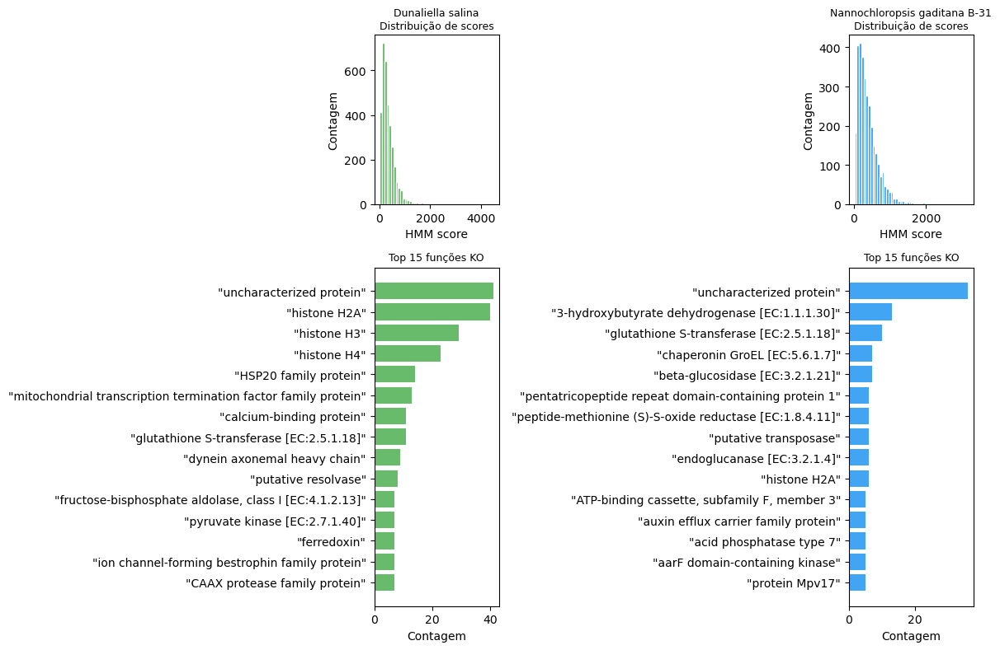

In [9]:
if kofam_dfs:
    n_sp = len(kofam_dfs)
    fig, axes = plt.subplots(2, n_sp, figsize=(12, 8),
                            gridspec_kw={'height_ratios': [1, 2]})
    if n_sp == 1:
        axes = axes.reshape(2, 1)
    colors = ['#4CAF50', '#2196F3']

    for i, (key, df) in enumerate(kofam_dfs.items()):
        # Cima: distribuição de scores
        axes[0, i].hist(df['score'].dropna(), bins=50,
                        color=colors[i], edgecolor='white')
        axes[0, i].set_title(f"{SPECIES[key]['label']}\nDistribuição de scores", fontsize=9)
        axes[0, i].set_xlabel('HMM score')
        axes[0, i].set_ylabel('Contagem')

        # Baixo: top 15 funções KO
        top = df['ko_def'].value_counts().head(15)
        axes[1, i].barh(top.index[::-1], top.values[::-1],
                        color=colors[i], alpha=0.85)
        axes[1, i].set_title('Top 15 funções KO', fontsize=9)
        axes[1, i].set_xlabel('Contagem')

    plt.tight_layout()
    plt.savefig('results/kofamscan_qc.png', dpi=150, bbox_inches='tight')
    plt.show()


## 7 · Análise KEGG — pathway coverage

**Coverage** = KOs detectados / total de KOs de referência na via  
- ≥ 50 % → **Complete** | 10–49 % → **Partial** | < 10 % → **Absent**

Resultados em cache local para minimizar chamadas à KEGG REST API.


In [10]:
KEGG_CACHE = DIRS['kegg_cache'] / 'cache.json'
THRESH_COMPLETE = 0.50
THRESH_PARTIAL  = 0.10

def load_cache():
    return json.load(open(KEGG_CACHE)) if KEGG_CACHE.exists() else {}

def save_cache(c):
    json.dump(c, open(KEGG_CACHE, 'w'))

def kegg_get(url, cache, ck):
    if ck in cache: return cache[ck]
    try:
        r = requests.get(url, timeout=20)
        cache[ck] = r.text if r.ok else ''
    except Exception:
        cache[ck] = ''
    time.sleep(0.35)
    return cache[ck]

def ko_pathways(ko, cache):
    txt = kegg_get(f'https://rest.kegg.jp/link/pathway/{ko}', cache, f'kp_{ko}')
    return [l.split('\t')[1].replace('path:', '').strip()
            for l in txt.strip().split('\n')
            if '\t' in l and 'path:ko' in l.split('\t')[1]]

def pathway_kos(pw, cache):
    txt = kegg_get(f'https://rest.kegg.jp/link/ko/{pw}', cache, f'pk_{pw}')
    return {l.split('\t')[1].replace('ko:', '').strip()
            for l in txt.strip().split('\n') if '\t' in l}

def pathway_name(pw, cache):
    txt = kegg_get(f'https://rest.kegg.jp/get/{pw}', cache, f'pn_{pw}')
    for l in txt.split('\n'):
        if l.startswith('NAME'):
            return l.split(None, 1)[1].strip().rstrip('.')
    return pw

print('Funções KEGG prontas.')


Funções KEGG prontas.


In [11]:
cache = load_cache()
ko_pw_maps = {}

for key, df in kofam_dfs.items():
    kos = set(df['ko'].dropna())
    print(f"[{SPECIES[key]['label']}] A mapear {len(kos):,} KOs...")
    m = {}
    for i, ko in enumerate(kos):
        m[ko] = ko_pathways(ko, cache)
        if (i + 1) % 300 == 0:
            save_cache(cache)
            print(f'  {i+1}/{len(kos)}...', end='\r')
    ko_pw_maps[key] = m
    save_cache(cache)
    found = {pw for pws in m.values() for pw in pws}
    print(f'{len(found):,} vias encontradas')

print('\nCache guardada.')


[Dunaliella salina] A mapear 2,616 KOs...
380 vias encontradas
[Nannochloropsis gaditana B-31] A mapear 2,532 KOs...
373 vias encontradas

Cache guardada.


In [25]:
for key, df in diamond_dfs.items():
    f = df[(df['pident'] >= 30) & (df['qcovhsp'] >= 50)]
    print(f"\n{SPECIES[key]['label']} (hits válidos)")
    print(f"  identidade mediana: {f['pident'].median():.1f}")
    print(f"  coverage mediano:   {f['qcovhsp'].median():.1f}")


Dunaliella salina (hits válidos)
  identidade mediana: 45.6
  coverage mediano:   84.0

Nannochloropsis gaditana B-31 (hits válidos)
  identidade mediana: 43.2
  coverage mediano:   80.0


In [12]:
all_pathways = {pw for m in ko_pw_maps.values() for pws in m.values() for pw in pws}
print(f'A processar {len(all_pathways)} vias...')

pw_data = {}
for i, pw in enumerate(sorted(all_pathways)):
    ref = pathway_kos(pw, cache)
    if not ref: continue
    pw_data[pw] = {}
    for key, m in ko_pw_maps.items():
        det  = {ko for ko, pws in m.items() if pw in pws}
        comp = len(det & ref) / len(ref)
        pw_data[pw][key] = {
            'present':      len(det & ref),
            'total':        len(ref),
            'completeness': round(comp, 3),
            'status': ('Complete' if comp >= THRESH_COMPLETE
            else 'Partial' if comp >= THRESH_PARTIAL else 'Absent'),
        }
    if (i + 1) % 100 == 0:
        save_cache(cache)
        print(f'  {i+1}/{len(all_pathways)}...', end='\r')
save_cache(cache)

rows = []
for pw, sp_data in pw_data.items():
    row = {'pathway_id': pw, 'pathway_name': pathway_name(pw, cache)}
    for key in SPECIES:
        if key in sp_data:
            for k, v in sp_data[key].items():
                row[f'{key}_{k}'] = v
    rows.append(row)

completeness_df = pd.DataFrame(rows).set_index('pathway_id')
out = DIRS['comparison'] / 'pathway_completeness.tsv'
completeness_df.to_csv(out, sep='\t')
print(f'\n{len(completeness_df):,} vias → {out}')
display(completeness_df.head())


A processar 397 vias...
  300/397...
397 vias → results/comparison/pathway_completeness.tsv


,pathway_name,D_salina_present,D_salina_total,D_salina_completeness,D_salina_status,N_gaditana_present,N_gaditana_total,N_gaditana_completeness,N_gaditana_status
pathway_id,,,,,,,,,
ko00010,Glycolysis / Gluconeogenesis,28,109,0.257,Partial,26,109,0.239,Partial
ko00020,Citrate cycle (TCA cycle),12,70,0.171,Partial,19,70,0.271,Partial
ko00030,Pentose phosphate pathway,15,94,0.160,Partial,17,94,0.181,Partial
ko00040,Pentose and glucuronate interconversions,6,97,0.062,Absent,10,97,0.103,Partial
ko00051,Fructose and mannose metabolism,10,121,0.083,Absent,14,121,0.116,Partial


,Complete,Partial,Absent
Species,,,
Dunaliella salina,11,166,220
Nannochloropsis gaditana B-31,8,178,211


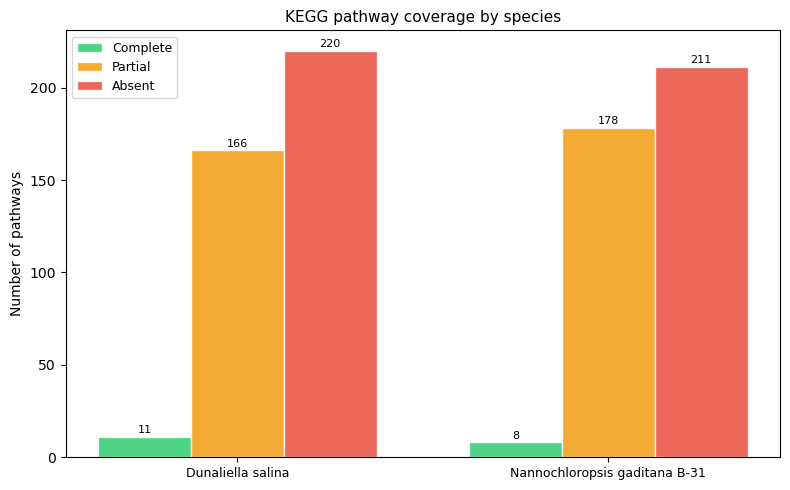

In [33]:
# Summary per species
summary_rows = []
for key in SPECIES:
    col = f'{key}_status'
    if col not in completeness_df.columns:
        continue
    c = completeness_df[col].value_counts()
    summary_rows.append({
        'Species':  SPECIES[key]['label'],
        'Complete': c.get('Complete', 0),
        'Partial':  c.get('Partial',  0),
        'Absent':   c.get('Absent',   0),
    })

summary_df = pd.DataFrame(summary_rows).set_index('Species')
display(summary_df)

fig, ax = plt.subplots(figsize=(8, 5))
x = np.arange(len(summary_df))
w = 0.25

for i, (status, col) in enumerate(zip(
        ['Complete', 'Partial', 'Absent'],
        ['#2ecc71',  '#f39c12', '#e74c3c'])):
    vals = [summary_df.loc[s, status] for s in summary_df.index]
    bars = ax.bar(x + i*w - w, vals, w, label=status,
                  color=col, alpha=0.85, edgecolor='white')
    for b, v in zip(bars, vals):
        if v > 0:
            ax.text(b.get_x() + b.get_width()/2, v + 1, str(v),
                    ha='center', va='bottom', fontsize=8)

ax.set_xticks(x)
ax.set_xticklabels(summary_df.index, fontsize=9)
ax.set_ylabel('Number of pathways')
ax.set_title('KEGG pathway coverage by species', fontsize=11)
ax.legend(fontsize=9)
plt.tight_layout()
plt.savefig('results/comparison/pathway_completeness_barplot.png', dpi=150, bbox_inches='tight')
plt.show()


,Complete,Partial,Absent
$\mathit{Dunaliella\ salina}$,11,198,188
$\mathit{Nannochloropsis\ gaditana}$ B-31,8,187,202


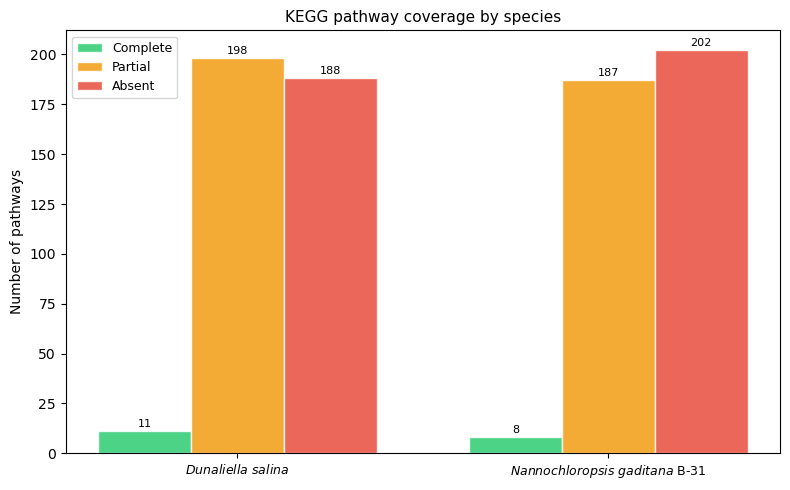

In [39]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Nomes em itálico (apenas o binómio científico fica em itálico; "B-31" fica normal)
labels_italic = [
    r'$\mathit{Dunaliella\ salina}$',
    r'$\mathit{Nannochloropsis\ gaditana}$ B-31',
]

summary_df = pd.DataFrame({
    'Complete': [11, 8],         # D. salina, N. gaditana
    'Partial':  [198, 187],      # D. salina, N. gaditana
    'Absent':   [188, 202],      # D. salina, N. gaditana
}, index=labels_italic)

display(summary_df)

fig, ax = plt.subplots(figsize=(8, 5))
x = np.arange(len(summary_df))
w = 0.25
for i, (status, col) in enumerate(zip(
        ['Complete', 'Partial', 'Absent'],
        ['#2ecc71',  '#f39c12', '#e74c3c'])):
    vals = [summary_df.loc[s, status] for s in summary_df.index]
    bars = ax.bar(x + i*w - w, vals, w, label=status,
                   color=col, alpha=0.85, edgecolor='white')
    for b, v in zip(bars, vals):
        if v > 0:
            ax.text(b.get_x() + b.get_width()/2, v + 1, str(v),
                    ha='center', va='bottom', fontsize=8)

ax.set_xticks(x)
ax.set_xticklabels(summary_df.index, fontsize=9)
ax.set_ylabel('Number of pathways')
ax.set_title('KEGG pathway coverage by species', fontsize=11)
ax.legend(fontsize=9)
plt.tight_layout()
plt.savefig('results/comparison/pathway_completeness_barplot.png', dpi=150, bbox_inches='tight')
plt.show()

In [14]:
# Vias-alvo de referência
TARGET_PATHWAYS = {
    'ko00906': 'Carotenoid biosynthesis',
    'ko01040': 'Biosynthesis of unsaturated fatty acids',
    'ko00061': 'Fatty acid biosynthesis',
    'ko00195': 'Photosynthesis',
    'ko00710': 'Carbon fixation — photosynthetic organisms',
    'ko00010': 'Glycolysis / Gluconeogenesis',
}
rows_t = []
for pw_id, pw_name in TARGET_PATHWAYS.items():
    if pw_id not in completeness_df.index:
        print(f'  {pw_name} ({pw_id}): não encontrada nos resultados')
        continue
    row = completeness_df.loc[pw_id]
    entry = {'Via': pw_name, 'ID': pw_id}
    for key in SPECIES:
        if f'{key}_present' in row:
            entry[SPECIES[key]['label']] = (
                f"{int(row[f'{key}_present'])}/{int(row[f'{key}_total'])} "
                f"({row[f'{key}_completeness']:.0%}) [{row[f'{key}_status']}]"
            )
    rows_t.append(entry)
if rows_t:
    display(pd.DataFrame(rows_t).set_index('Via'))


,ID,Dunaliella salina,Nannochloropsis gaditana B-31
Via,,,
Carotenoid biosynthesis,ko00906,12/61 (20%) [Partial],8/61 (13%) [Partial]
Biosynthesis of unsaturated fatty acids,ko01040,6/32 (19%) [Partial],7/32 (22%) [Partial]
Fatty acid biosynthesis,ko00061,12/40 (30%) [Partial],9/40 (22%) [Partial]
Photosynthesis,ko00195,24/63 (38%) [Partial],39/63 (62%) [Complete]
Carbon fixation — photosynthetic organisms,ko00710,20/37 (54%) [Complete],22/37 (60%) [Complete]
Glycolysis / Gluconeogenesis,ko00010,28/109 (26%) [Partial],26/109 (24%) [Partial]


## 8 · reCOGnyzer — anotação COG

Atribui categorias COG via RPS-BLAST (NCBI CDD, Pfam, SMART, KOG, COG, PRK).  
Primeira execução: descarrega ~2 GB de bases de dados (~20 min).  

> **Nota:** o ficheiro de output do reCOGnyzer chama-se `reCOGnizer_results.tsv`,
> não `functional_summary.tsv`. A função abaixo localiza-o correctamente.


In [15]:
def check_recognizer_db():
    """Testa o recognizer com um FASTA mínimo — força download da DB se necessário."""
    test_dir = Path('/tmp/recognizer_test')
    test_dir.mkdir(exist_ok=True)
    test_faa = test_dir / 'test.faa'
    test_faa.write_text('>test\nMKTAYIAKQRQISFVKSHFSRQHPEFDFSASHESTDYVHSKHTAA\n')
    print("[reCOGnyzer] A verificar/descarregar base de dados (~2 GB na 1ª vez)...")
    r = subprocess.run(
        ['recognizer', '-f', str(test_faa), '-o', str(test_dir), '--threads', '1'],
        capture_output=True, text=True, timeout=3600
    )
    print(f"  rc={r.returncode}")
    if r.stdout: print(f"  STDOUT: {r.stdout[-400:]}")
    if r.stderr: print(f"  STDERR: {r.stderr[-400:]}")
    return r.returncode in (0, 1)

db_ok = check_recognizer_db()
if not db_ok:
    print("Base de dados não verificada — os resultados podem ser 0.")

def sanitize_fasta(faa_in, faa_out):
    '''Cria cópia do FASTA com IDs sem espaços (necessário para reCOGnyzer).
    Substitui espaços nos headers por underscores.
    Devolve o path do ficheiro limpo.
    '''
    if faa_out.exists() and faa_out.stat().st_size > 0:
        return faa_out
    print(f'  A sanitizar headers: {faa_in.name} → {faa_out.name}')
    with open(faa_in) as fin, open(faa_out, 'w') as fout:
        for line in fin:
            if line.startswith('>'):
                # Guarda só o primeiro token do ID, sem espaços
                fout.write('>' + line[1:].split()[0] + '\n')
            else:
                fout.write(line)
    n = sum(1 for l in open(faa_out) if l.startswith('>'))
    print(f'{n:,} proteínas sanitizadas → {faa_out}')
    return faa_out

def run_recognyzer(key, faa, threads=8):
    out_dir  = DIRS['recogNyzer'] / key
    out_file = out_dir / 'functional_summary.tsv'

    if out_file.exists() and out_file.stat().st_size > 500:
        n = sum(1 for _ in open(out_file)) - 1
        print(f'[SKIP] {key}: {n:,} anotações COG já existem.')
        return out_file

    if not faa or not faa.exists():
        print(f'[ERRO] {key}: FASTA não encontrado.'); return None

    if subprocess.run(['which', 'recognizer'], capture_output=True).returncode != 0:
        print('[ERRO] recognizer não encontrado — corre a célula 1 primeiro.')
        return None

    out_dir.mkdir(parents=True, exist_ok=True)

    # Sanitiza headers antes de passar ao reCOGnyzer
    faa_clean = out_dir / f'{key}_sanitized.faa'
    faa_to_use = sanitize_fasta(faa, faa_clean)

    print(f"[reCOGnyzer] {SPECIES[key]['label']} ({threads} threads)...")
    result = subprocess.run(
        ['recognizer', '-f', str(faa_to_use), '-o', str(out_dir), '--threads', str(threads)],
        capture_output=True, text=True, timeout=7200
    )
    if result.stderr: print(result.stderr[-400:])

    # O ficheiro real chama-se reCOGnizer_results.tsv
    candidates = sorted(out_dir.glob('reCOGnizer_results*.tsv'))
    if not candidates:
        candidates = sorted(out_dir.rglob('*.tsv'))
        # Exclui o nosso functional_summary para não se auto-referenciar
        candidates = [c for c in candidates if 'functional_summary' not in c.name]
    if candidates:
        shutil.copy(candidates[0], out_file)
        df = pd.read_csv(out_file, sep='\t')
        print(f'{len(df):,} anotações COG → {out_file}')
    else:
        print(f'Sem output TSV em {out_dir}. rc={result.returncode}')
        if result.stderr:
            print(result.stderr[-300:])
    return out_file

recog_results = {}
for key, faa in faa_paths.items():
    print(f"\n--- {SPECIES[key]['label']} ---")
    recog_results[key] = run_recognyzer(key, faa)


[reCOGnyzer] A verificar/descarregar base de dados (~2 GB na 1ª vez)...
  rc=1
  STDOUT: 2026-06-19 21:07:39: Running annotation with RPS-BLAST and TIGR database as reference.
A valid Tigr split database was found!
2026-06-19 21:07:40: Organizing annotation results
[1/7] Handling NCBI_Curated annotation
[2/7] Handling Pfam annotation
[3/7] Handling SMART annotation
[4/7] Handling KOG annotation
[5/7] Handling COG annotation
[6/7] Handling PRK annotation
[7/7] Handling TIGR annotation

  STDERR: ", line 1110, in <module>
    main()
  File "/home/jose-campos/miniconda3/envs/prjenv/bin/recognizer", line 1100, in main
    organize_results(
  File "/home/jose-campos/miniconda3/envs/prjenv/bin/recognizer", line 1045, in organize_results
    raise RuntimeError(f"reCOGnizer report is empty! Something likely went haywire!")
RuntimeError: reCOGnizer report is empty! Something likely went haywire!


--- Dunaliella salina ---
[SKIP] D_salina: 1,569 anotações COG já existem.

--- Nannochloropsis ga

Mapeamento COG carregado: 4,877 entradas


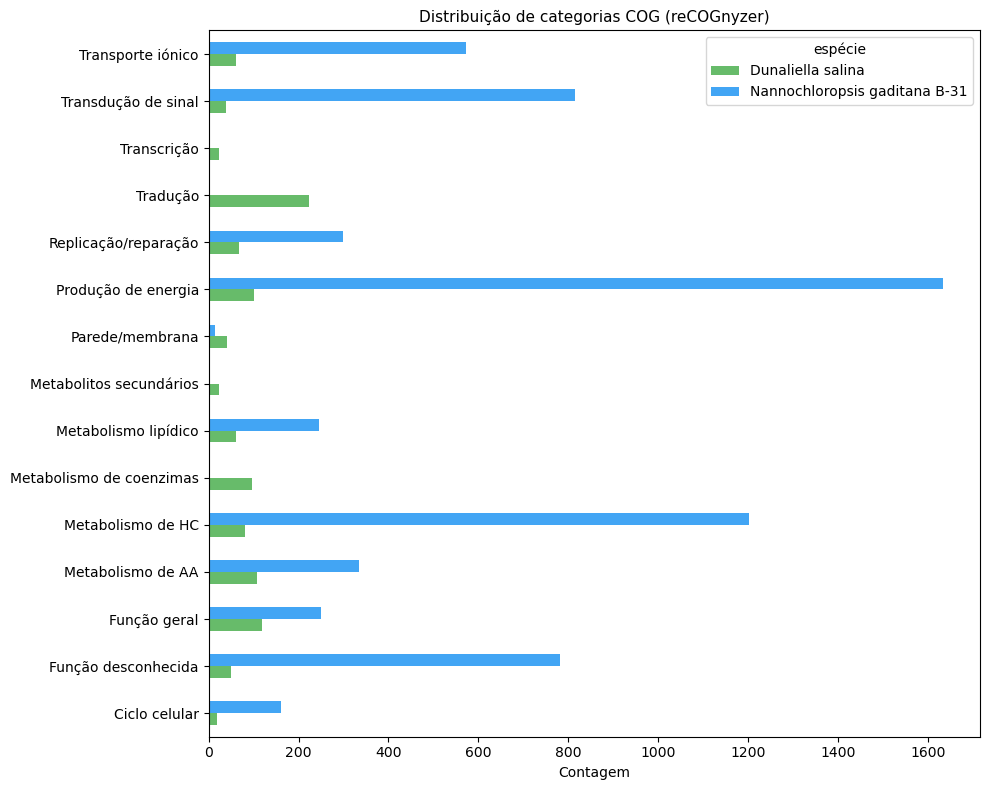

In [16]:
COG_CAT = {
    'J':'Tradução','K':'Transcrição','L':'Replicação/reparação',
    'D':'Ciclo celular','T':'Transdução de sinal','M':'Parede/membrana',
    'C':'Produção de energia','G':'Metabolismo de HC',
    'E':'Metabolismo de AA','H':'Metabolismo de coenzimas',
    'I':'Metabolismo lipídico','P':'Transporte iónico',
    'Q':'Metabolitos secundários','R':'Função geral','S':'Função desconhecida',
}

# Mapeamento COG ID → categoria (para D. salina que não tem letras diretas)
COG_ID_TO_CAT = {}
try:
    cog_map_url = ("https://ftp.ncbi.nlm.nih.gov/pub/COG/COG2020/data/cog-20.def.tab")
    r = requests.get(cog_map_url, timeout=30)
    if r.ok:
        for line in r.text.strip().split('\n'):
            parts = line.split('\t')
            if len(parts) >= 2:
                COG_ID_TO_CAT[parts[0]] = parts[1]  # COG0001 → D
        print(f"Mapeamento COG carregado: {len(COG_ID_TO_CAT):,} entradas")
except Exception as e:
    print(f"[AVISO]  Não foi possível carregar mapeamento COG: {e}")

recog_dfs = {}
for key, tsv in recog_results.items():
    if tsv and tsv.exists() and tsv.stat().st_size > 500:
        recog_dfs[key] = pd.read_csv(tsv, sep='\t')

cog_rows = []
for key, df in recog_dfs.items():
    cats = []

    # Caso 1: N. gaditana — tem coluna 'Functional category'
    if 'Functional category' in df.columns:
        cats = (df['Functional category'].dropna()
                  .astype(str)
                  .apply(list)
                  .explode()
                  .tolist())

    # Caso 2: D. salina — sem header, última coluna tem IDs tipo COG0464
    elif COG_ID_TO_CAT:
        last_col = df.columns[-1]
        cog_ids  = df[last_col].dropna().astype(str)
        cats     = [COG_ID_TO_CAT[c] for c in cog_ids if c in COG_ID_TO_CAT]

    if not cats:
        print(f"[AVISO] {key}: sem categorias COG encontradas")
        print(f"  Colunas: {list(df.columns)}")
        continue

    for c in cats:
        if c in COG_CAT:
            cog_rows.append({'espécie': SPECIES[key]['label'],
                             'categoria': COG_CAT[c], 'n': 1})

if cog_rows:
    cog_df = pd.DataFrame(cog_rows)
    pivot  = cog_df.groupby(['espécie','categoria'])['n'].sum().unstack('espécie').fillna(0)
    fig, ax = plt.subplots(figsize=(10, 8))
    pivot.plot(kind='barh', ax=ax, alpha=0.85, color=['#4CAF50','#2196F3'])
    ax.set_title('Distribuição de categorias COG (reCOGnyzer)', fontsize=11)
    ax.set_xlabel('Contagem'); ax.set_ylabel('')
    plt.tight_layout()
    plt.savefig('results/recogNyzer_cog_distribution.png', dpi=150, bbox_inches='tight')
    plt.show()


## 9 · DIAMOND blastp vs Swiss-Prot

Anotação complementar por homologia.
Também usado para validação cruzada com KofamScan (célula 10).


In [17]:
SP_FASTA = DIRS['swissprot'] / 'uniprot_sprot.fasta'
SP_DMND  = DIRS['swissprot'] / 'swissprot.dmnd'

def get_swissprot():
    if SP_FASTA.exists() and SP_FASTA.stat().st_size > 1e6:
        print(f'[SKIP] Swiss-Prot já presente ({SP_FASTA.stat().st_size/1e6:.0f} MB)')
        return True
    print('[DOWNLOAD] Swiss-Prot (~270 MB)...')
    gz = DIRS['swissprot'] / 'uniprot_sprot.fasta.gz'
    r = subprocess.run([
        'wget', '-q', '--show-progress', '-O', str(gz),
        'https://ftp.uniprot.org/pub/databases/uniprot/current_release/'
        'knowledgebase/complete/uniprot_sprot.fasta.gz'
    ])
    if r.returncode != 0:
        print('[ERRO] Download falhou.'); return False
    subprocess.run(['gunzip', '-f', str(gz)], check=True)
    n = sum(1 for l in open(SP_FASTA) if l.startswith('>'))
    print(f'{n:,} entradas Swiss-Prot')
    return True

def build_diamond_db(threads=8):
    if SP_DMND.exists() and SP_DMND.stat().st_size > 1e6:
        print('[SKIP] DIAMOND DB já construída.'); return True
    if subprocess.run(['which', 'diamond'], capture_output=True).returncode != 0:
        print('[ERRO] diamond não encontrado — corre a célula 1 primeiro.'); return False
    print('[DIAMOND makedb] ~1-2 min...')
    subprocess.run(['diamond', 'makedb', '--in', str(SP_FASTA),
                    '--db', str(SP_DMND), '--threads', str(threads)], check=True)
    print(f'{SP_DMND}')
    return True

if get_swissprot():
    build_diamond_db()


[SKIP] Swiss-Prot já presente (287 MB)
[SKIP] DIAMOND DB já construída.


In [18]:
DCOLS = ['qseqid', 'sseqid', 'pident', 'length', 'evalue', 'bitscore', 'stitle', 'qcovhsp']

def run_diamond(key, faa, threads=8):
    out = DIRS['diamond'] / f'{key}_diamond_hits.tsv'
    if out.exists() and out.stat().st_size > 0:
        print(f'[SKIP] {key}: resultados DIAMOND já existem.'); return out
    if not faa or not faa.exists():
        print(f'[ERRO] {key}: FASTA não encontrado.'); return out
    if not SP_DMND.exists():
        print('[ERRO] DIAMOND DB não existe — corre a célula anterior.'); return out
    print(f"[DIAMOND] {SPECIES[key]['label']} vs Swiss-Prot...")
    subprocess.run([
        'diamond', 'blastp',
        '--db',              str(SP_DMND),
        '--query',           str(faa),
        '--out',             str(out),
        '--outfmt', '6',     *DCOLS,
        '--sensitive',
        '--evalue',          '1e-5',
        '--max-target-seqs', '5',
        '--threads',         str(threads),
    ], check=True)
    n = sum(1 for _ in open(out))
    print(f'{n:,} hits → {out}')
    return out

diamond_results = {}
for key, faa in faa_paths.items():
    diamond_results[key] = run_diamond(key, faa)


[SKIP] D_salina: resultados DIAMOND já existem.
[SKIP] N_gaditana: resultados DIAMOND já existem.


Dunaliella salina
  Anotadas : 7,039/16,697 (42.2%)
  Identidade mediana : 41.2%   cobertura: 73.2%
Nannochloropsis gaditana B-31
  Anotadas : 5,663/10,929 (51.8%)
  Identidade mediana : 39.4%   cobertura: 70.0%


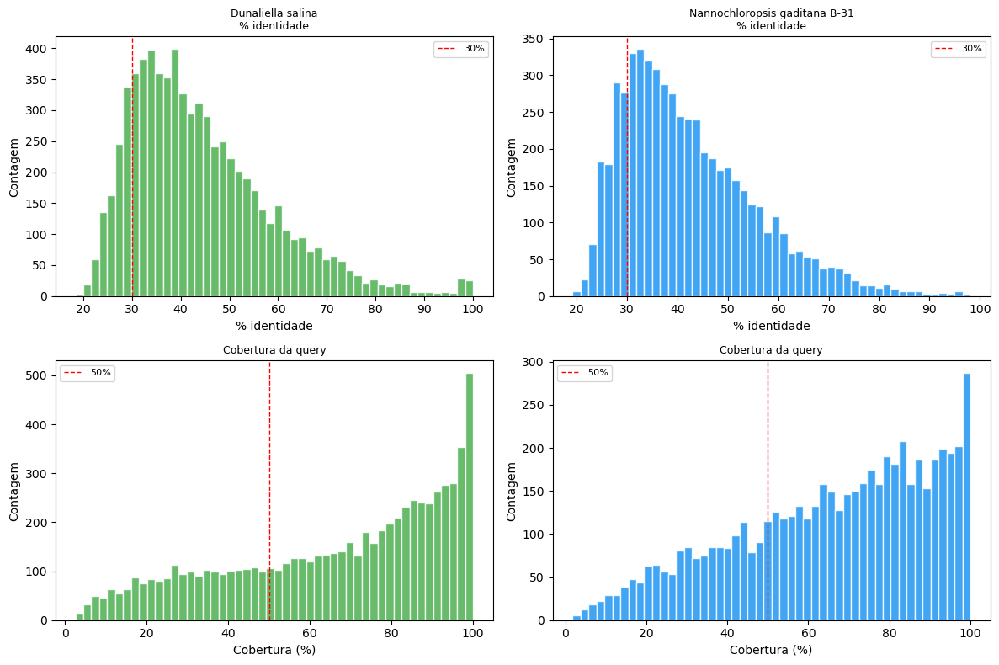

In [19]:
def load_diamond(tsv):
    df = pd.read_csv(tsv, sep='\t', header=None, names=DCOLS)
    return df.sort_values('bitscore', ascending=False).groupby('qseqid').first().reset_index()

diamond_dfs = {}
for key, tsv in diamond_results.items():
    if tsv.exists() and tsv.stat().st_size > 0:
        diamond_dfs[key] = load_diamond(tsv)
        total = sum(1 for l in open(faa_paths[key]) if l.startswith('>'))
        d = diamond_dfs[key]
        print(f"{SPECIES[key]['label']}")
        print(f'  Anotadas : {len(d):,}/{total:,} ({100*len(d)/total:.1f}%)')
        print(f'  Identidade mediana : {d["pident"].median():.1f}%   cobertura: {d["qcovhsp"].median():.1f}%')

if diamond_dfs:
    n_sp = len(diamond_dfs)
    fig, axes = plt.subplots(2, n_sp, figsize=(6 * n_sp, 8))
    if n_sp == 1: axes = axes.reshape(2, 1)
    colors = ['#4CAF50', '#2196F3']
    for i, (key, df) in enumerate(diamond_dfs.items()):
        axes[0, i].hist(df['pident'], bins=50, color=colors[i], edgecolor='white', alpha=0.85)
        axes[0, i].set_title(f"{SPECIES[key]['label']}\n% identidade", fontsize=9)
        axes[0, i].axvline(30, color='red', ls='--', lw=1, label='30%')
        axes[0, i].legend(fontsize=8)
        axes[0, i].set_xlabel('% identidade'); axes[0, i].set_ylabel('Contagem')
        axes[1, i].hist(df['qcovhsp'], bins=50, color=colors[i], edgecolor='white', alpha=0.85)
        axes[1, i].set_title('Cobertura da query', fontsize=9)
        axes[1, i].axvline(50, color='red', ls='--', lw=1, label='50%')
        axes[1, i].legend(fontsize=8)
        axes[1, i].set_xlabel('Cobertura (%)'); axes[1, i].set_ylabel('Contagem')
    plt.tight_layout()
    plt.savefig('results/diamond_distributions.png', dpi=150, bbox_inches='tight')
    plt.show()


## 10 · Validação cruzada — sobreposição KofamScan vs DIAMOND

Proteínas anotadas por **ambas** as ferramentas são candidatos de alta confiança.  
Esta análise substitui um pseudo-benchmark (que inflacionaria a especificidade
ao contar proteínas sem homólogo Swiss-Prot como verdadeiros negativos).



Dunaliella salina
  Total proteínas         :  16,697
  KofamScan anotadas      :   3,265
  DIAMOND anotadas        :   7,039
  Ambas (alta confiança)  :   3,100  (18.6%)
  Só KofamScan            :     165
  Só DIAMOND              :   3,939
  Nenhuma (hipotéticas)   :   9,493

Nannochloropsis gaditana B-31
  Total proteínas         :  10,929
  KofamScan anotadas      :   3,077
  DIAMOND anotadas        :   5,663
  Ambas (alta confiança)  :   2,932  (26.8%)
  Só KofamScan            :     145
  Só DIAMOND              :   2,731
  Nenhuma (hipotéticas)   :   5,121


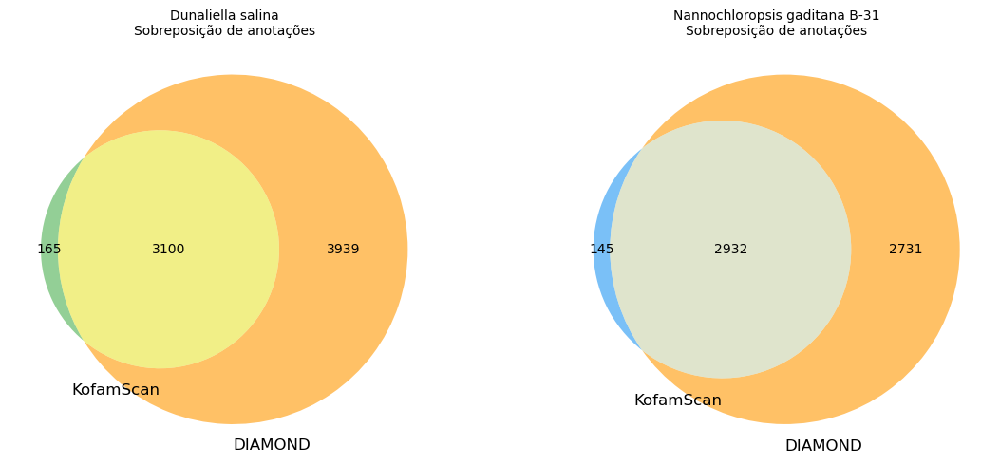

In [20]:
from matplotlib_venn import venn2

n_plots = sum(1 for k in SPECIES if k in kofam_dfs and k in diamond_dfs)
if n_plots == 0:
    print('Corre as células 6 e 9 primeiro.')
else:
    fig, axes = plt.subplots(1, n_plots, figsize=(6 * n_plots, 5))
    if n_plots == 1: axes = [axes]
    colors = ['#4CAF50', '#2196F3']
    for ax, key, col in zip(axes, SPECIES, colors):
        if key not in kofam_dfs or key not in diamond_dfs: continue
        all_ids = {l[1:].split()[0] for l in open(faa_paths[key]) if l.startswith('>')}
        kg = set(kofam_dfs[key]['gene'])
        dg = set(diamond_dfs[key]['qseqid'])
        shared = kg & dg
        print(f"\n{SPECIES[key]['label']}")
        print(f'  Total proteínas         : {len(all_ids):>7,}')
        print(f'  KofamScan anotadas      : {len(kg):>7,}')
        print(f'  DIAMOND anotadas        : {len(dg):>7,}')
        print(f'  Ambas (alta confiança)  : {len(shared):>7,}  ({100*len(shared)/max(len(all_ids),1):.1f}%)')
        print(f'  Só KofamScan            : {len(kg-dg):>7,}')
        print(f'  Só DIAMOND              : {len(dg-kg):>7,}')
        print(f'  Nenhuma (hipotéticas)   : {len(all_ids-kg-dg):>7,}')
        venn2(subsets=(len(kg-dg), len(dg-kg), len(shared)),
              set_labels=('KofamScan', 'DIAMOND'),
              set_colors=(col, '#FF9800'), alpha=0.6, ax=ax)
        ax.set_title(f"{SPECIES[key]['label']}\nSobreposição de anotações", fontsize=10)
    plt.tight_layout()
    plt.savefig('results/crossvalidation_venn.png', dpi=150, bbox_inches='tight')
    plt.show()


In [21]:
# ── Benchmark: KofamScan vs Swiss-Prot (gold standard) ──────────────────
# Gold standard: proteína tem hit Swiss-Prot com ≥30% identidade e ≥50% cobertura
MIN_IDENTITY = 30
MIN_COVERAGE = 50

bench_results = {}
for key in SPECIES:
    if key not in kofam_dfs or key not in diamond_dfs:
        continue

    # Todas as proteínas
    all_ids = {l[1:].split()[0] for l in open(faa_paths[key]) if l.startswith('>')}

    # Positivos KofamScan = proteínas com KO
    kofam_pos = set(kofam_dfs[key]['gene'])

    # Positivos gold standard = hits Swiss-Prot acima dos limiares
    d = diamond_dfs[key]
    gold_pos = set(d[(d['pident'] >= MIN_IDENTITY) &
                     (d['qcovhsp'] >= MIN_COVERAGE)]['qseqid'])

    # Matriz de confusão
    TP = len(kofam_pos & gold_pos)
    FP = len(kofam_pos - gold_pos)
    FN = len(gold_pos - kofam_pos)
    TN = len(all_ids - kofam_pos - gold_pos)

    sens = TP / (TP + FN) if (TP + FN) else 0
    spec = TN / (TN + FP) if (TN + FP) else 0
    prec = TP / (TP + FP) if (TP + FP) else 0
    f1   = 2 * prec * sens / (prec + sens) if (prec + sens) else 0

    bench_results[key] = {'sensitivity': sens, 'specificity': spec,
                          'precision': prec, 'f1': f1,
                          'TP': TP, 'FP': FP, 'FN': FN, 'TN': TN}

    print(f"\n{SPECIES[key]['label']}")
    print(f"  TP={TP}  FP={FP}  FN={FN}  TN={TN}")
    print(f"  Sensitivity: {sens:.2f}")
    print(f"  Specificity: {spec:.2f}")
    print(f"  Precision:   {prec:.2f}")
    print(f"  F1 score:    {f1:.2f}")


Dunaliella salina
  TP=2350  FP=915  FN=2051  TN=11381
  Sensitivity: 0.53
  Specificity: 0.93
  Precision:   0.72
  F1 score:    0.61

Nannochloropsis gaditana B-31
  TP=2156  FP=921  FN=1353  TN=6499
  Sensitivity: 0.61
  Specificity: 0.88
  Precision:   0.70
  F1 score:    0.65


In [27]:
print([k for k in dir() if 'kofam' in k.lower() or 'ko_' in k.lower()])

['ko_pathways', 'ko_pw_maps', 'kofam_dfs', 'kofam_pos', 'kofam_results', 'load_kofamscan', 'run_kofamscan']


In [28]:
ko_sets = {
    key: set(df['ko'].dropna())
    for key, df in kofam_dfs.items()
}

# Confirmar
for key, s in ko_sets.items():
    print(f"{SPECIES[key]['label']}: {len(s)} KOs únicos")

Dunaliella salina: 2616 KOs únicos
Nannochloropsis gaditana B-31: 2532 KOs únicos


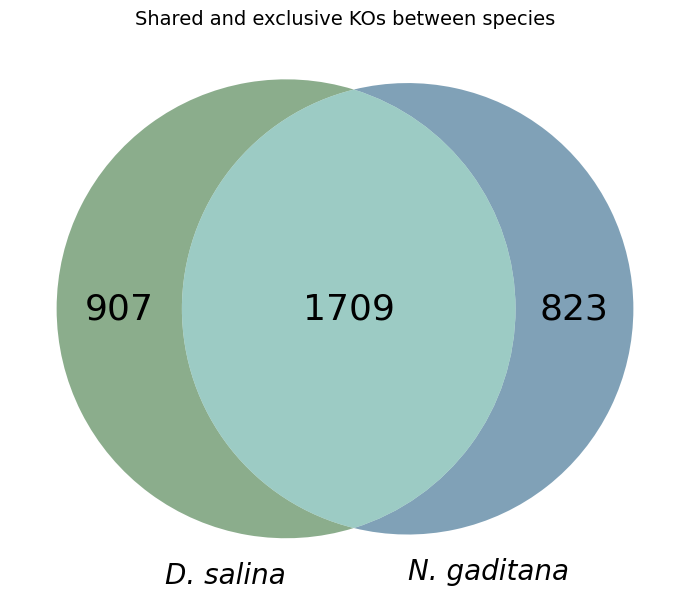

<Figure size 640x480 with 0 Axes>

In [32]:
from matplotlib_venn import venn2
import matplotlib.pyplot as plt



ds = ko_sets['D_salina']
ng = ko_sets['N_gaditana']

fig, ax = plt.subplots(figsize=(7, 6))
v = venn2(subsets=(len(ds - ng), len(ng - ds), len(ds & ng)),
          set_labels=('D. salina', 'N. gaditana'),
          set_colors=('#5A8A5C', '#4A7A99'), alpha=0.7, ax=ax)

# >>> AUMENTAR OS NÚMEROS DAS REGIÕES (907, 1709, 823) <
for sid in ('10', '01', '11'):
    lbl = v.get_label_by_id(sid)
    if lbl: lbl.set_fontsize(26)

# >>> AUMENTAR OS NOMES DAS ESPÉCIES <
for tid in ('A', 'B'):
    lbl = v.get_label_by_id(tid)
    if lbl:
        lbl.set_fontsize(20)
        lbl.set_fontstyle('italic')

ax.set_title('Shared and exclusive KOs between species', fontsize=14)
plt.tight_layout()
plt.savefig('results/comparison/ko_species_venn.png', dpi=150, bbox_inches='tight')
plt.show()
for tid in ('A', 'B'):
    lbl = v.get_label_by_id(tid)
    if lbl: lbl.set_fontstyle('italic')

ax.set_title('Shared and exclusive KOs between species', fontsize=12)
plt.tight_layout()
plt.savefig('results/comparison/ko_species_venn.png', dpi=150, bbox_inches='tight')
plt.show()

## 11 · Comparação inter-espécies de KOs


Dunaliella salina: 2,616 KOs únicos
Nannochloropsis gaditana B-31: 2,532 KOs únicos

KOs partilhados             : 1,709
Dunaliella salina exclusivos : 907
Nannochloropsis gaditana B-31 exclusivos : 823
Listas guardadas em results/comparison/


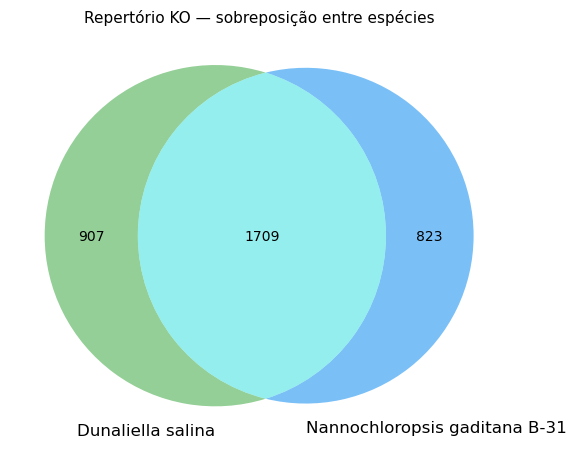

In [ ]:
ko_sets = {}
for key, tsv in kofam_results.items():
    if not tsv.exists() or tsv.stat().st_size < 100: continue
    kos = set()
    for l in open(tsv):
        if l.startswith('#') or not l.strip(): continue
        p = l.split('\t') if '\t' in l else l.split()
        if p[0].strip() == '*' and len(p) >= 3 and p[2].strip().startswith('K'):
            kos.add(p[2].strip())
    ko_sets[key] = kos
    print(f"{SPECIES[key]['label']}: {len(kos):,} KOs únicos")

if len(ko_sets) == 2:
    keys   = list(ko_sets)
    shared  = ko_sets[keys[0]] & ko_sets[keys[1]]
    only_0  = ko_sets[keys[0]] - ko_sets[keys[1]]
    only_1  = ko_sets[keys[1]] - ko_sets[keys[0]]
    print(f'\nKOs partilhados             : {len(shared):,}')
    print(f'{SPECIES[keys[0]]["label"]} exclusivos : {len(only_0):,}')
    print(f'{SPECIES[keys[1]]["label"]} exclusivos : {len(only_1):,}')

    # Guardar listas
    pd.DataFrame({'ko': sorted(shared)}).to_csv('results/comparison/ko_shared.tsv', sep='\t', index=False)
    pd.DataFrame({'ko': sorted(only_0)}).to_csv(f'results/comparison/ko_only_{keys[0]}.tsv', sep='\t', index=False)
    pd.DataFrame({'ko': sorted(only_1)}).to_csv(f'results/comparison/ko_only_{keys[1]}.tsv', sep='\t', index=False)
    print('Listas guardadas em results/comparison/')

    fig, ax = plt.subplots(figsize=(6, 5))
    venn2(subsets=(len(only_0), len(only_1), len(shared)),
          set_labels=(SPECIES[keys[0]]['label'], SPECIES[keys[1]]['label']),
          set_colors=('#4CAF50', '#2196F3'), alpha=0.6, ax=ax)
    ax.set_title('Repertório KO — sobreposição entre espécies', fontsize=11)
    plt.tight_layout()
    plt.savefig('results/ko_species_venn.png', dpi=150, bbox_inches='tight')
    plt.show()
else:
    print('Corre a célula 5 (KofamScan) para ambas as espécies.')


## 12 · Vias-alvo — carotenoides & omega-3 PUFA


espécie                                 Dunaliella salina  \
via                         ferramenta                      
Biossíntese de carotenoides DIAMOND                    54   
                            KofamScan                  26   
Biossíntese omega-3 / PUFA  DIAMOND                     5   
                            KofamScan                   3   

espécie                                 Nannochloropsis gaditana B-31  
via                         ferramenta                                 
Biossíntese de carotenoides DIAMOND                                32  
                            KofamScan                              19  
Biossíntese omega-3 / PUFA  DIAMOND                                19  
                            KofamScan                               2

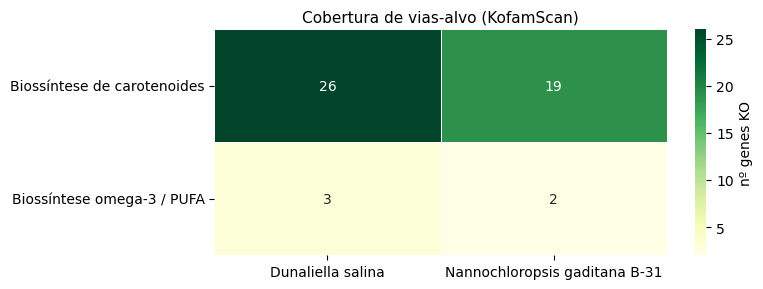

In [ ]:
TARGET_KW = {
    'Biossíntese de carotenoides': [
        'phytoene', 'carotene', 'carotenoid', 'lycopene', 'zeaxanthin',
        'violaxanthin', 'xanthophyll', 'isopentenyl', 'geranylgeranyl',
        'beta-carotene', 'lutein', 'neoxanthin',
    ],
    'Biossíntese omega-3 / PUFA': [
        'fatty acid desaturase', 'delta-5', 'delta-6', 'delta-9',
        'elongase', 'eicosapentaenoic', 'docosahexaenoic',
        'alpha-linolenic', 'stearidonic', 'omega-3', 'acyl-CoA desaturase',
    ],
}

rows_t = []
for key, df in kofam_dfs.items():
    for pathway, kws in TARGET_KW.items():
        hits = df[df['ko_def'].str.contains('|'.join(kws), case=False, na=False)]
        rows_t.append({'espécie': SPECIES[key]['label'], 'via': pathway,
                       'ferramenta': 'KofamScan', 'n_genes': len(hits)})
for key, df in diamond_dfs.items():
    for pathway, kws in TARGET_KW.items():
        hits = df[df['stitle'].str.contains('|'.join(kws), case=False, na=False)]
        rows_t.append({'espécie': SPECIES[key]['label'], 'via': pathway,
                       'ferramenta': 'DIAMOND', 'n_genes': len(hits)})

target_df = pd.DataFrame(rows_t)
display(target_df.pivot_table(index=['via', 'ferramenta'], columns='espécie',
                               values='n_genes', aggfunc='sum'))

pivot = (target_df[target_df['ferramenta'] == 'KofamScan']
         .pivot(index='via', columns='espécie', values='n_genes'))
if not pivot.empty:
    fig, ax = plt.subplots(figsize=(8, 3))
    sns.heatmap(pivot, annot=True, fmt='d', cmap='YlGn',
                linewidths=0.5, ax=ax, cbar_kws={'label': 'nº genes KO'})
    ax.set_title('Cobertura de vias-alvo (KofamScan)', fontsize=11)
    ax.set_xlabel(''); ax.set_ylabel('')
    plt.tight_layout()
    plt.savefig('results/target_pathways_heatmap.png', dpi=150, bbox_inches='tight')
    plt.show()


> **Nota:** a taxa de anotação de *D. salina* (20.2%) é mais baixa que a de *N. gaditana* (29.3%) porque a *D. salina* foi descarregada do UniProt (menos registos curados), enquanto a *N. gaditana* vem do NCBI com mais proteínas anotadas.

In [ ]:
for key, df in kofam_dfs.items():
    print(f"{SPECIES[key]['label']} — hits KofamScan nas vias-alvo")
    for pathway, kws in TARGET_KW.items():
        hits = df[df['ko_def'].str.contains('|'.join(kws), case=False, na=False)]
        print(f'\n  {pathway} ({len(hits)} genes):')
        for _, row in hits.iterrows():
            print(f"    {row['ko']:12s}  {row['ko_def'][:65]}")


Dunaliella salina — hits KofamScan nas vias-alvo

  Biossíntese de carotenoides (26 genes):
    K14050        "geranylgeranyl transferase type-2 subunit alpha [EC:2.5.1.60]"
    K13789        "geranylgeranyl diphosphate synthase, type II [EC:2.5.1.1 2.5.1.1
    K15744        "zeta-carotene isomerase [EC:5.2.1.12]"
    K17911        "beta-carotene isomerase [EC:5.2.1.14]"
    K17911        "beta-carotene isomerase [EC:5.2.1.14]"
    K09838        "zeaxanthin epoxidase [EC:1.14.15.21]"
    K06443        "lycopene beta-cyclase [EC:5.5.1.19]"
    K17911        "beta-carotene isomerase [EC:5.2.1.14]"
    K09837        "carotenoid epsilon hydroxylase [EC:1.14.14.158]"
    K01823        "isopentenyl-diphosphate Delta-isomerase [EC:5.3.3.2]"
    K05956        "geranylgeranyl transferase type-2 subunit beta [EC:2.5.1.60]"
    K02291        "15-cis-phytoene synthase [EC:2.5.1.32]"
    K05955        "protein farnesyltransferase/geranylgeranyltransferase type-1 sub
    K10960        "geranylgerany

## 13 · KEGGCharter — mapas de vias metabólicas

Mapas-alvo: `ko00906` (Carotenoides), `ko01040` (AG insaturados),
`ko00195` (Fotossíntese), `ko00010` (Glicólise).

In [ ]:
RD         = Path('resources/keggcharter_rd')
kgml_dir   = RD / 'kc_kgmls'
kgml_dir.mkdir(parents=True, exist_ok=True)
TARGET_MAPS = '00906,01040'

# Numeric IDs only — KEGGCharter adds 'ko' prefix internally
for map_id in ['00906', '01040']:
    xml_path = kgml_dir / f'{map_id}.xml'
    if xml_path.exists() and xml_path.stat().st_size > 100:
        print(f'[SKIP] {xml_path.name}'); continue
    print(f'Downloading {map_id}...')
    urllib.request.urlretrieve(
        f'https://rest.kegg.jp/get/ko{map_id}/kgml', xml_path)
    print(f'  {xml_path.name}: {xml_path.stat().st_size:,} bytes')

for bad in kgml_dir.glob('ko0*.xml'):
    bad.unlink()
    print(f'Removed: {bad.name}')

def run_keggcharter(key, kofam_tsv):
    out_dir  = DIRS['keggcharter'] / key
    maps_dir = out_dir / 'maps'
    out_dir.mkdir(parents=True, exist_ok=True)

    if maps_dir.exists() and len(list(maps_dir.glob('*.png'))) >= 2:
        n = len(list(maps_dir.glob('*.png')))
        print(f'[SKIP] {key}: {n} mapas ja existem.'); return out_dir

    if not kofam_tsv.exists():
        print(f'[ERRO] {kofam_tsv} nao encontrado.'); return out_dir

    if subprocess.run(['which', 'keggcharter'], capture_output=True).returncode != 0:
        print('[ERRO] keggcharter nao encontrado.'); return out_dir

    # Delete cached intermediate files
    for cached in ['KEGGCharter_results.tsv', 'data_for_charting.tsv']:
        p = out_dir / cached
        if p.exists(): p.unlink()

    ko_counts = (kofam_dfs[key]
                 .groupby('ko').size()
                 .reset_index(name='count'))
    ko_counts = ko_counts[ko_counts['ko'].str.match(r'^K\d{5}$', na=False)]
    ko_counts['ec']   = ''
    ko_counts['taxa'] = 'reference'

    ko_input = Path(f'/tmp/{key}_kc.tsv')
    ko_counts.to_csv(ko_input, sep='\t', index=False)

    print(f"[KEGGCharter] {SPECIES[key]['label']}...")
    result = subprocess.run([
        'keggcharter', '-f', str(ko_input),
        '-o',   str(out_dir),
        '-rd',  str(RD),
        '-mm',  TARGET_MAPS,
        '-koc', 'ko', '-qcol', 'count',
        '-ecc', 'ec', '-tc', 'taxa',
        '--map-all',
    ], capture_output=True, text=True)
    ko_input.unlink(missing_ok=True)

    pngs = list(maps_dir.glob('*.png')) if maps_dir.exists() else []
    if pngs: print(f'[OK] {len(pngs)} mapa(s) -> {maps_dir}')
    else:    print('[AVISO] Sem mapas. STDERR:\n' + result.stderr[-400:])
    return out_dir

keggcharter_dirs = {}
for key, tsv in kofam_results.items():
    keggcharter_dirs[key] = run_keggcharter(key, tsv)


[SKIP] 00906.xml
[SKIP] 01040.xml
[SKIP] D_salina: 4 mapas ja existem.
[SKIP] N_gaditana: 4 mapas ja existem.


In [ ]:
def run_keggcharter_comparative():
    out_dir  = DIRS['keggcharter'] / 'comparison'
    maps_dir = out_dir / 'maps'
    out_dir.mkdir(parents=True, exist_ok=True)

    if maps_dir.exists() and any(maps_dir.glob('*.png')):
        print('[SKIP] Mapas comparativos ja existem.'); return
    if len(kofam_dfs) < 2:
        print('[SKIP] Precisa das duas especies anotadas.'); return

    # Delete cached intermediate files
    for cached in ['KEGGCharter_results.tsv', 'data_for_charting.tsv']:
        p = out_dir / cached
        if p.exists(): p.unlink()

    keys = list(kofam_dfs)
    c1 = SPECIES[keys[0]]['label'].split()[0]
    c2 = SPECIES[keys[1]]['label'].split()[0]

    ds = kofam_dfs[keys[0]].groupby('ko').size().reset_index(name=c1)
    ng = kofam_dfs[keys[1]].groupby('ko').size().reset_index(name=c2)
    merged = pd.merge(ds, ng, on='ko', how='outer').fillna(0)
    merged = merged[merged['ko'].str.match(r'^K\d{5}$', na=False)]
    merged['ec']   = ''
    merged['taxa'] = 'reference'

    ko_input = Path('/tmp/kc_comp.tsv')
    merged.to_csv(ko_input, sep='\t', index=False)

    print('[KEGGCharter] Mapa comparativo...')
    result = subprocess.run([
        'keggcharter', '-f', str(ko_input),
        '-o',   str(out_dir),
        '-rd',  str(RD),
        '-mm',  TARGET_MAPS,
        '-koc', 'ko', '-qcol', f'{c1},{c2}',
        '-ecc', 'ec', '-tc', 'taxa',
        '--map-all',
    ], capture_output=True, text=True)
    ko_input.unlink(missing_ok=True)

    pngs = list(maps_dir.glob('*.png')) if maps_dir.exists() else []
    if pngs: print(f'[OK] {len(pngs)} mapa(s) comparativo(s) -> {maps_dir}')
    else:    print('[AVISO] Sem mapas. STDERR:\n' + result.stderr[-400:])

run_keggcharter_comparative()


[SKIP] Mapas comparativos ja existem.



Dunaliella salina (4 mapas):
  differential_Biosynthesis of unsaturated fatty acids.png


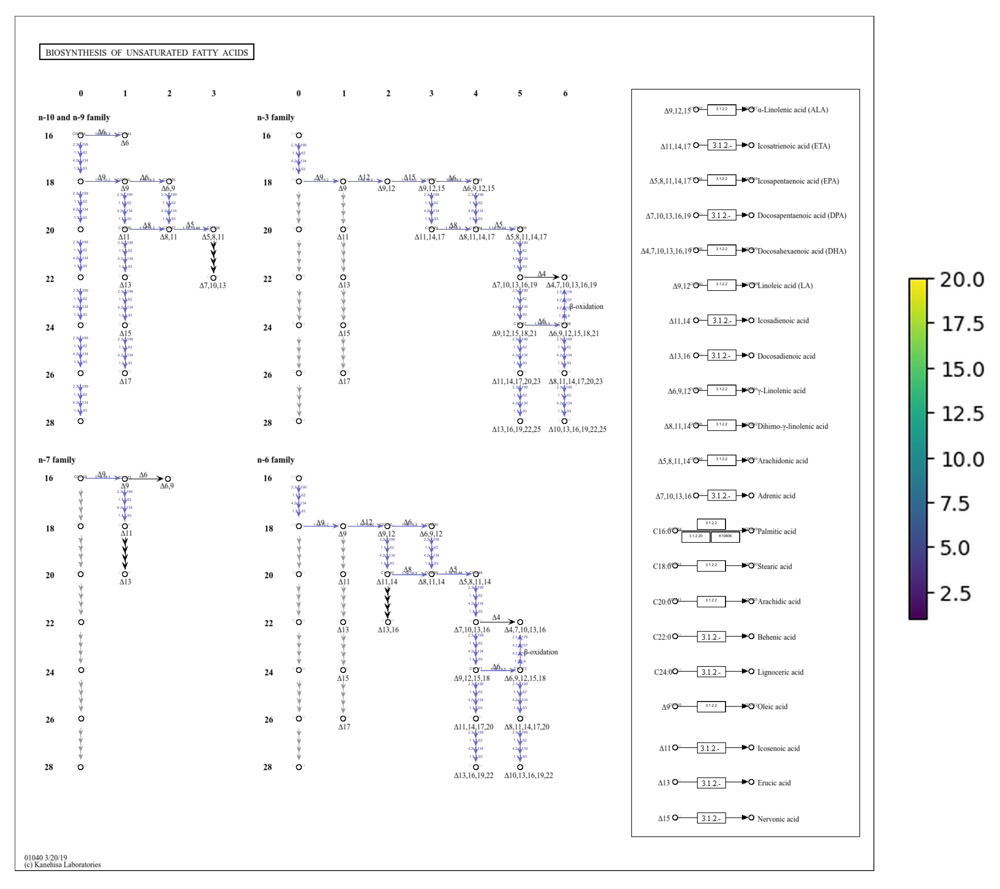

  differential_Carotenoid biosynthesis.png


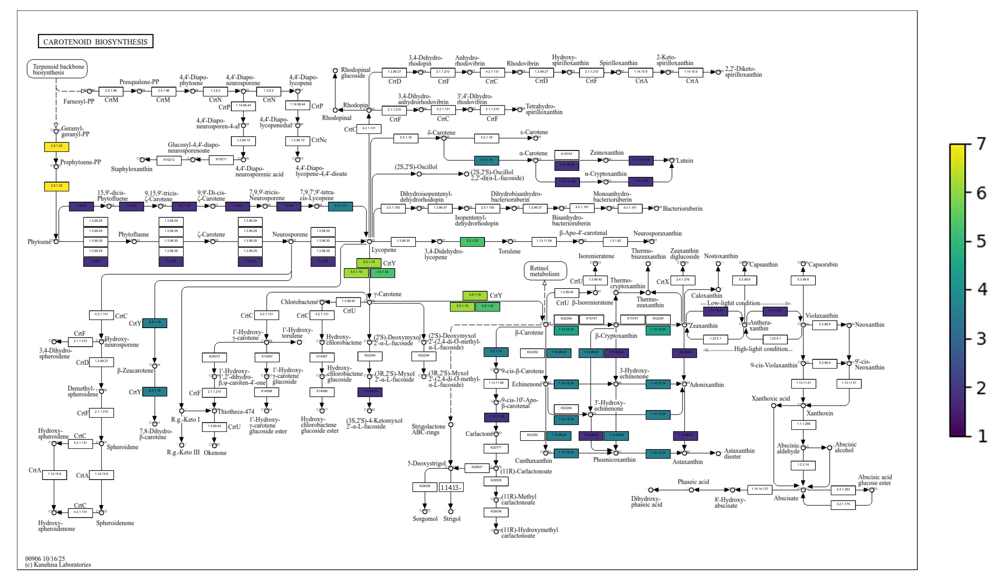

  potential_Biosynthesis of unsaturated fatty acids.png


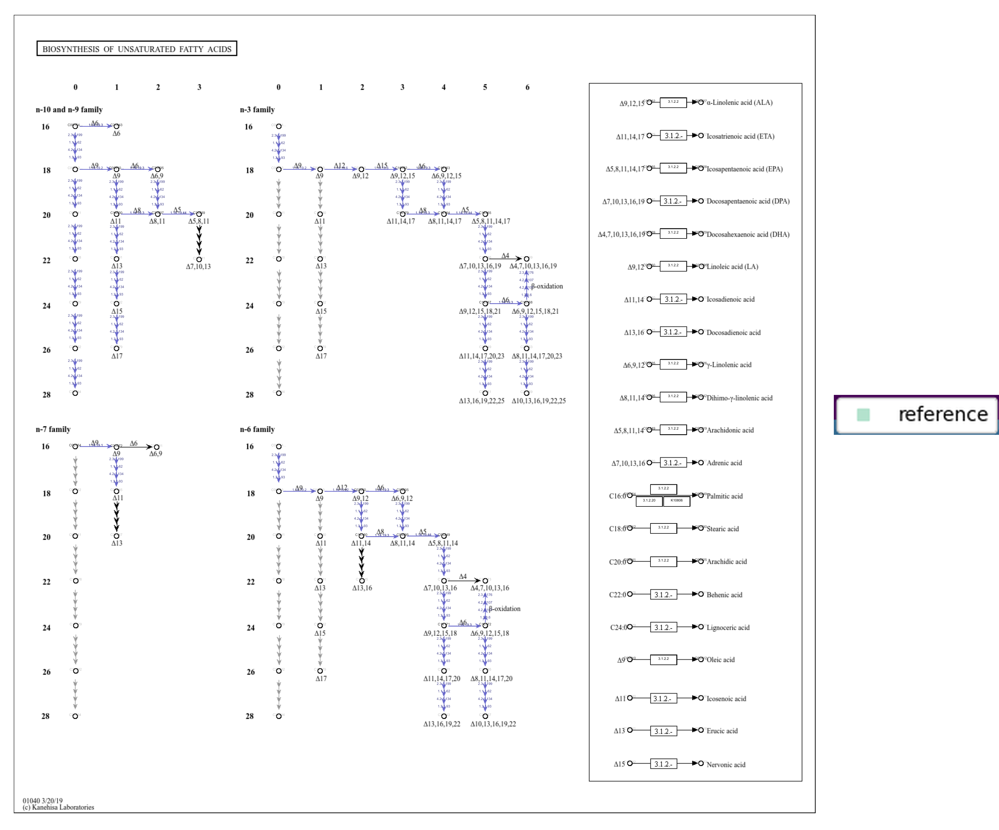

  potential_Carotenoid biosynthesis.png


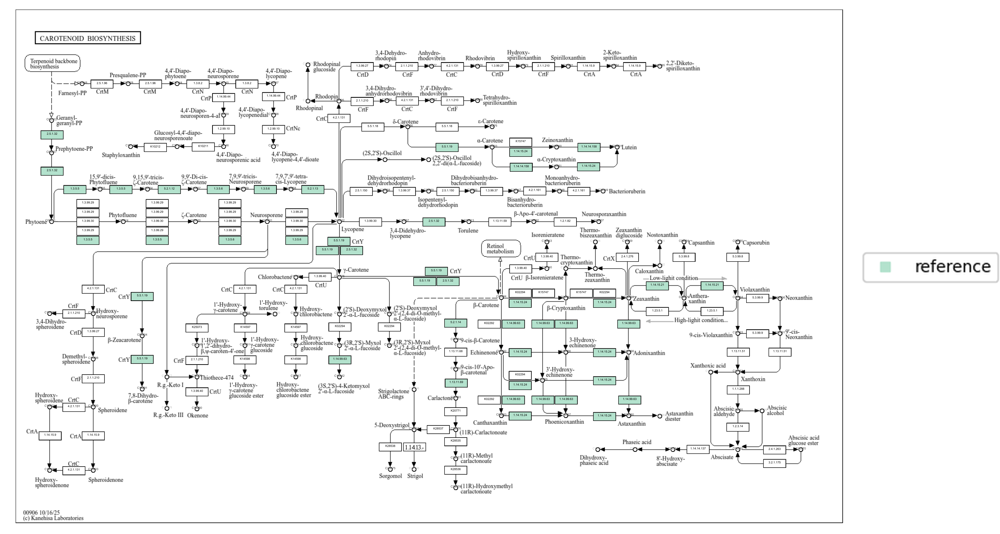


Nannochloropsis gaditana B-31 (4 mapas):
  differential_Biosynthesis of unsaturated fatty acids.png


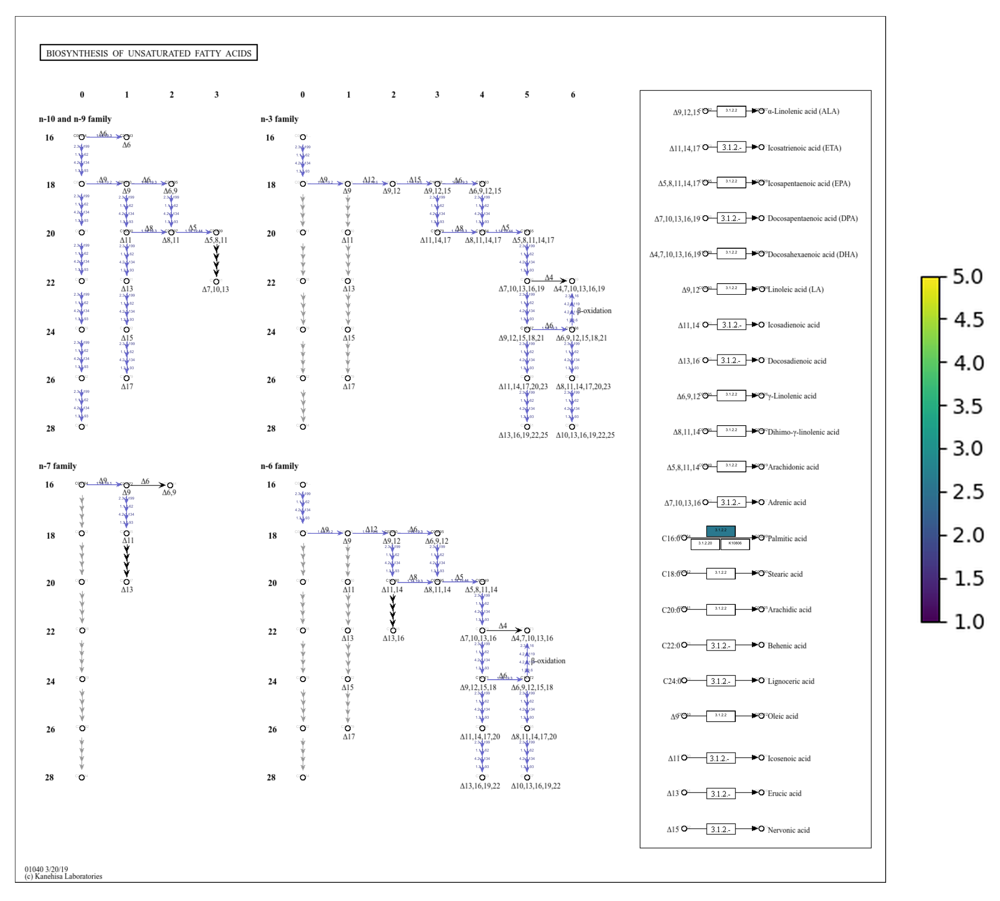

  differential_Carotenoid biosynthesis.png


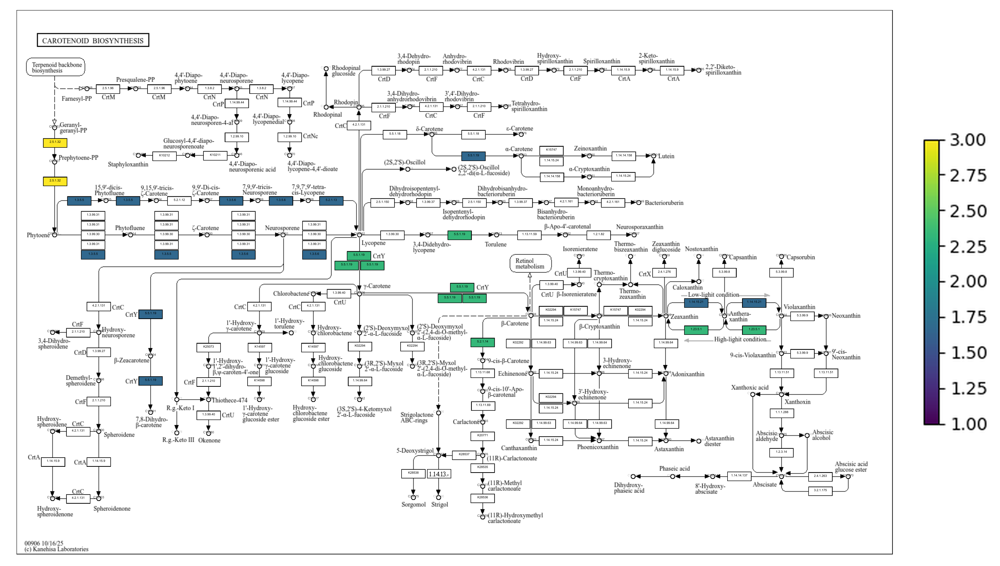

  potential_Biosynthesis of unsaturated fatty acids.png


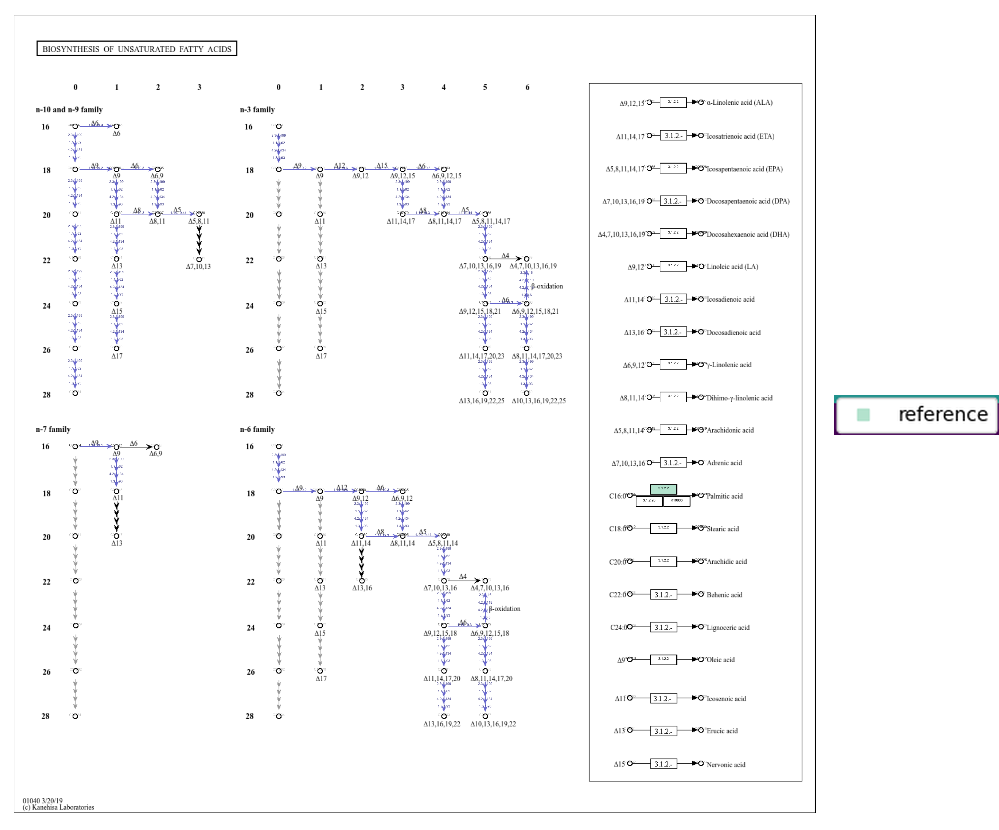

  potential_Carotenoid biosynthesis.png


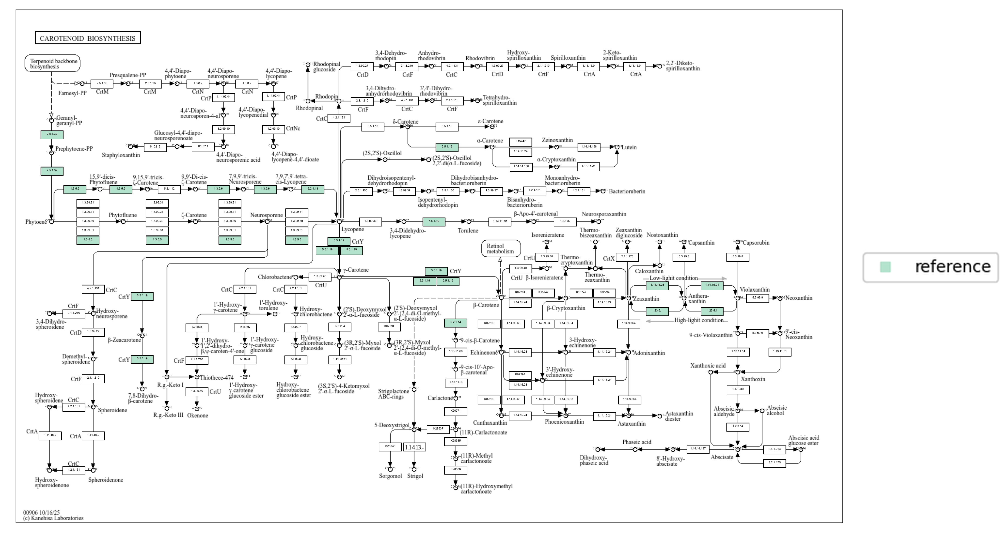

Comparativo: differential_Biosynthesis of unsaturated fatty acids.png


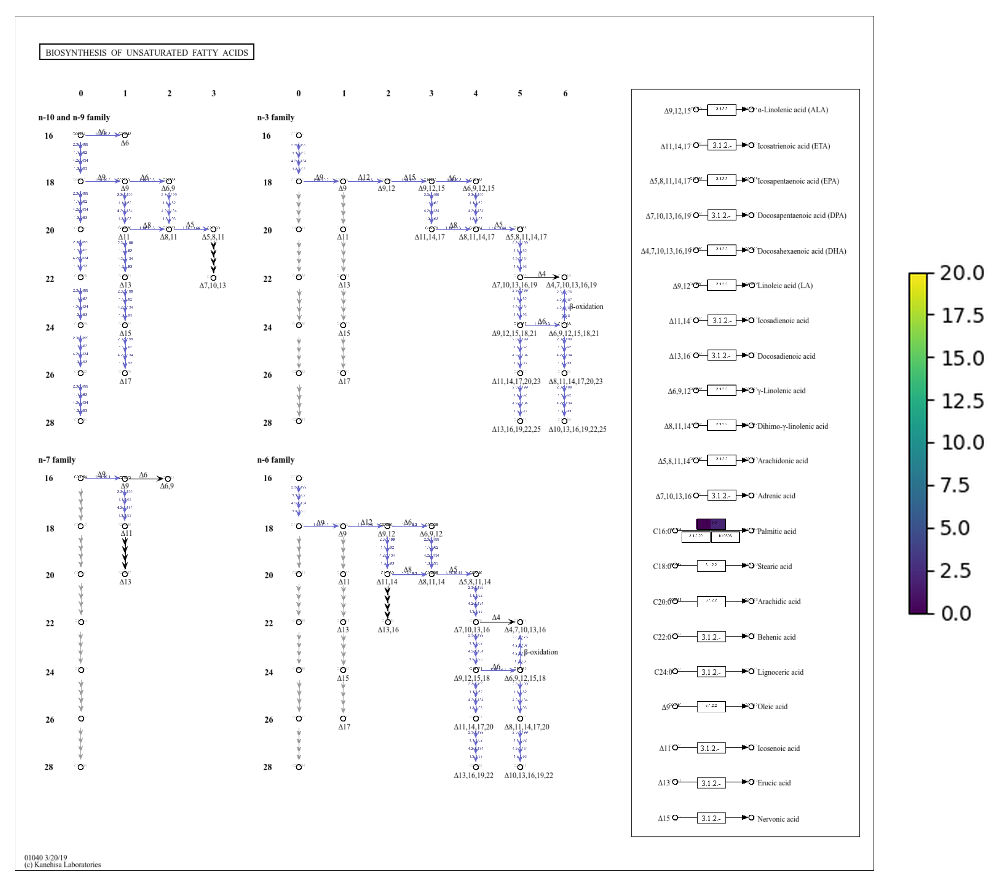

Comparativo: differential_Carotenoid biosynthesis.png


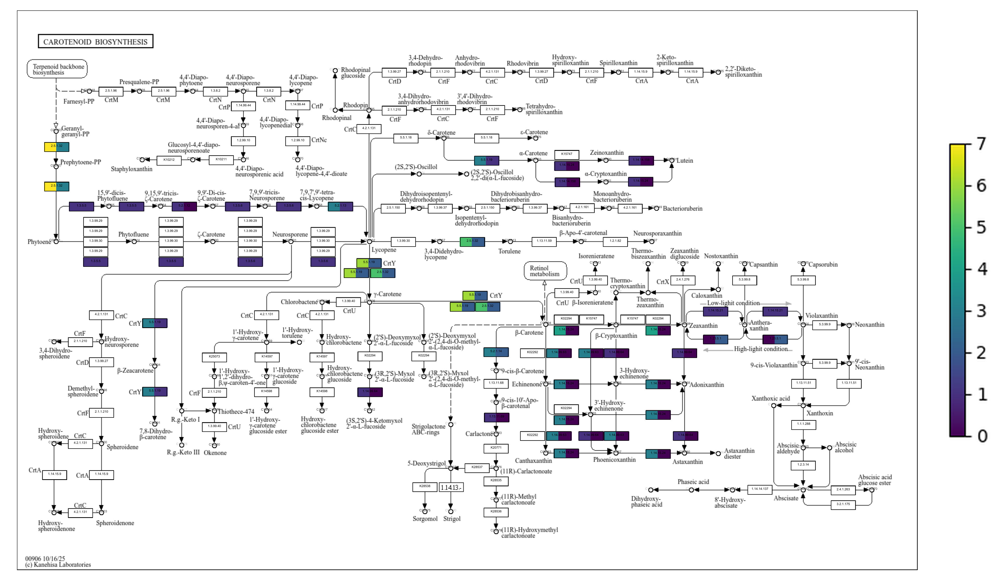

Comparativo: potential_Biosynthesis of unsaturated fatty acids.png


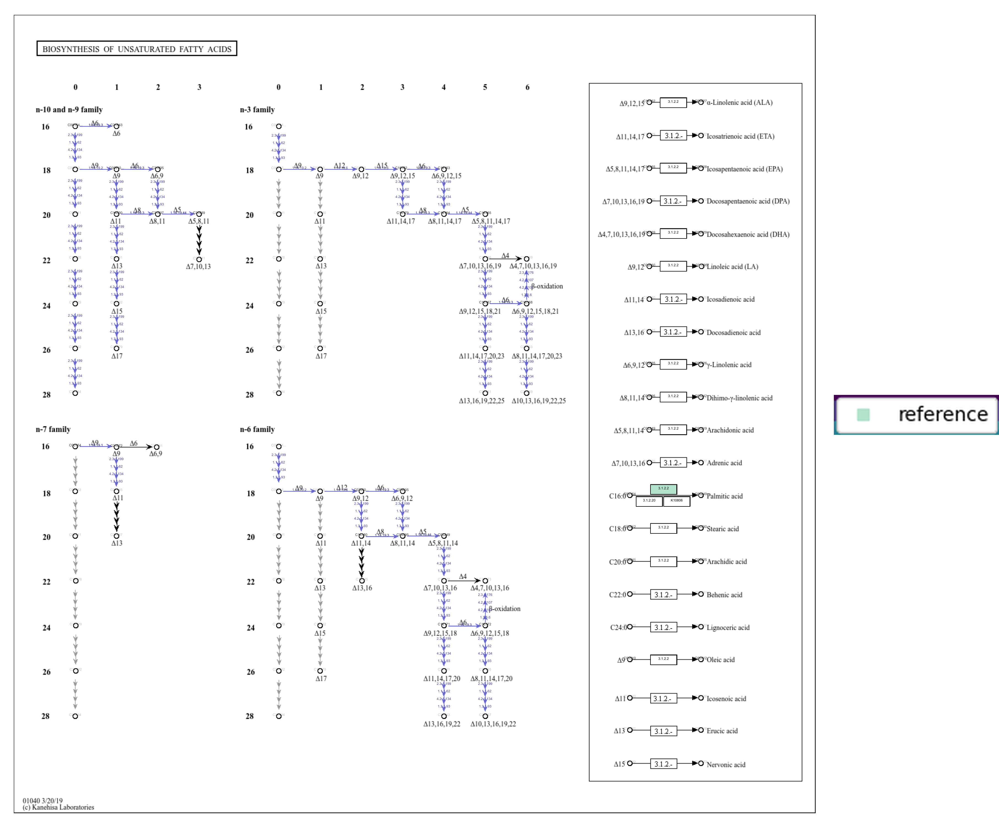

Comparativo: potential_Carotenoid biosynthesis.png


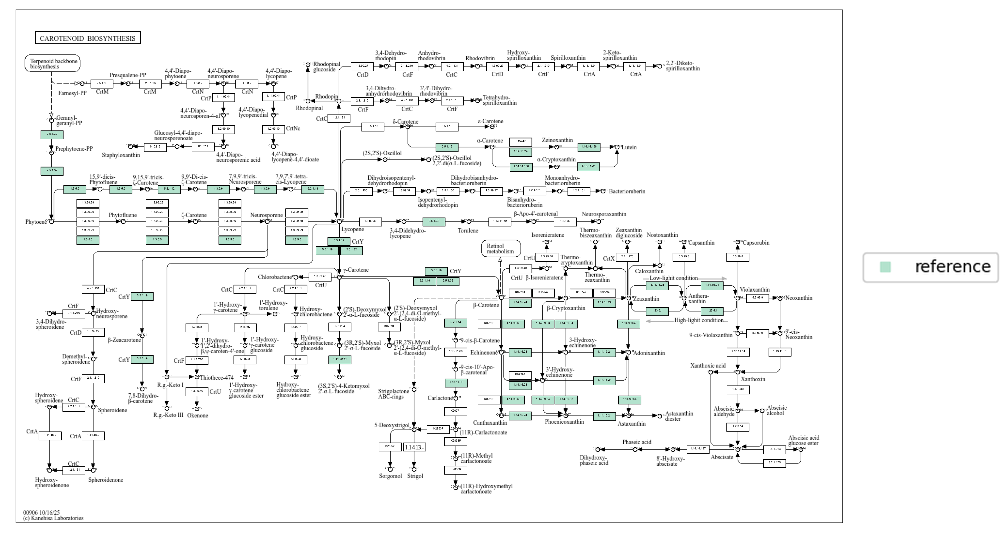

In [ ]:
from IPython.display import Image, display as ipy_display

for key, out_dir in keggcharter_dirs.items():
    maps_dir = out_dir / 'maps'
    pngs = sorted(maps_dir.glob('*.png')) if maps_dir.exists() else []
    if pngs:
        print(f"\n{SPECIES[key]['label']} ({len(pngs)} mapas):")
        for png in pngs[:4]:
            print(f'  {png.name}'); ipy_display(Image(str(png), width=700))
    else:
        print(f"{SPECIES[key]['label']}: sem mapas — verifica a célula anterior")

comp = DIRS['keggcharter'] / 'comparison' / 'maps'
if comp.exists():
    for png in sorted(comp.glob('*.png'))[:4]:
        print(f'Comparativo: {png.name}')
        ipy_display(Image(str(png), width=700))


## Resumo dos outputs

| Passo | Ficheiro(s) |
|---|---|
| QC proteínas | `results/qc_protein_lengths.png` |
| KofamScan | `results/kofamscan/<espécie>_kofam.tsv` |
| KofamScan QC | `results/kofamscan_qc.png` |
| Coverage de vias | `results/comparison/pathway_completeness.tsv` |
| Gráfico coverage | `results/comparison/pathway_completeness_barplot.png` |
| KOs partilhados/exclusivos | `results/comparison/ko_shared.tsv` + `ko_only_*.tsv` |
| COG (reCOGnyzer) | `results/recogNyzer_cog_distribution.png` |
| DIAMOND distribuições | `results/diamond_distributions.png` |
| Venn validação cruzada | `results/crossvalidation_venn.png` |
| Venn inter-espécies | `results/ko_species_venn.png` |
| Heatmap vias-alvo | `results/target_pathways_heatmap.png` |
| KEGGCharter por espécie | `results/keggcharter/<espécie>/maps/` |
| KEGGCharter comparativo | `results/keggcharter/comparison/maps/` |
